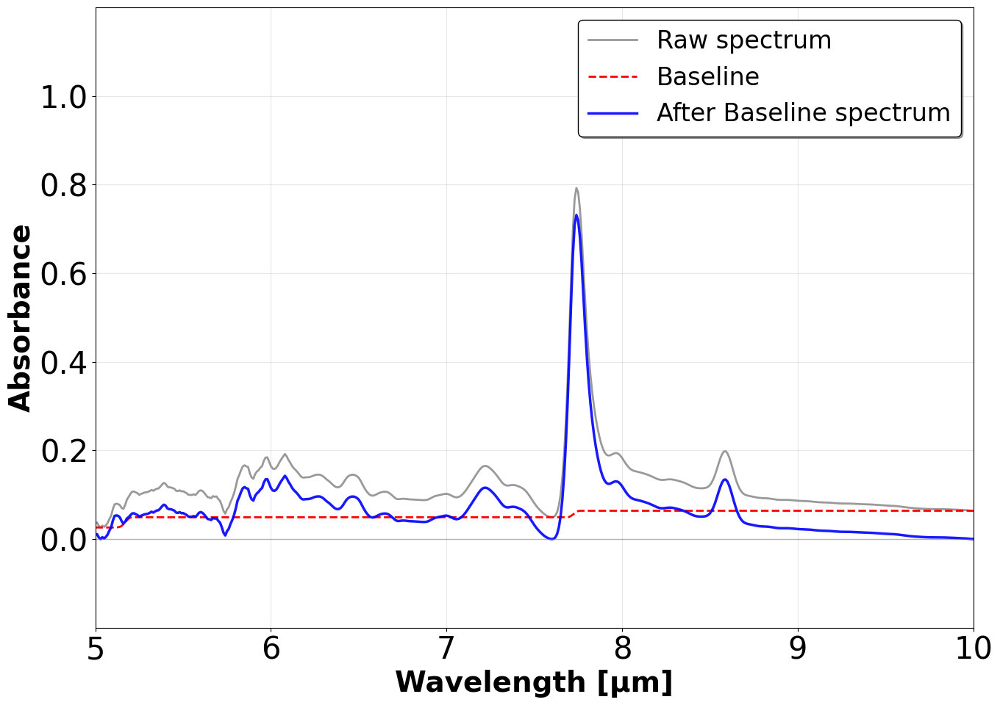

In [1]:

# 必要なライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import pandas as pd

# フォントサイズの設定
rcParams['font.size'] = 20
rcParams['axes.labelsize'] = 26
rcParams['axes.titlesize'] = 20
rcParams['xtick.labelsize'] = 30
rcParams['ytick.labelsize'] = 30
rcParams['legend.fontsize'] = 24
rcParams['figure.titlesize'] = 22

# ベースライン補正関数
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅推定関数
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# データファイルパスの設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
path_ref = base_path + 'ref/'
time_point = '1014'

# 波長範囲の設定（5–15 µm → 5–10 µm に限定）
yw_nm = np.arange(5000, 15000, 10)
yw = yw_nm / 1000
mask = (yw >= 5.0) & (yw <= 10.0)
yw = yw[mask]

# 空間分解能パラメータ
xst, yst = 150, 130
sbin = 28
x0 = np.arange(xst, xst+11*sbin, sbin)
y0 = np.arange(yst, yst+11*sbin, sbin)

# 中心領域（i6-j6）のピクセル位置
i, j = 5, 5
pix_x, pix_y = x0[j], y0[i]

# データ読み込みと吸収スペクトル計算
path_sam = base_path + time_point + '/'
Zs_tg = np.load(path_sam + 'tg.npy')
Zs_ref = np.load(path_ref + 'ref.npy')
Absorb = np.log10(Zs_ref / Zs_tg)

# 中心領域の平均スペクトル抽出（波長方向にマスク適用）
spectrum_full = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
spectrum = spectrum_full[mask]

# ベースライン補正
baseline = rolling_ball_baseline(spectrum)
corrected_spectrum = spectrum - baseline

# グラフ描画（5–10 µm）- Raw, Baseline, Corrected の3つを表示
fig, ax = plt.subplots(figsize=(14, 10))

# Raw spectrum（生スペクトル）
ax.plot(yw, spectrum, color='gray', linewidth=2.0, label='Raw spectrum', alpha=0.8)

# Baseline（ベースライン）
ax.plot(yw, baseline, color='red', linewidth=2.0, label='Baseline', linestyle='--')

# Corrected spectrum（補正後スペクトル）
ax.plot(yw, corrected_spectrum, color='blue', linewidth=2.5, label='After Baseline spectrum', alpha=0.9)

ax.set_xlim([5, 10])
ax.set_ylim([-0.2, 1.2])
ax.grid(True, alpha=0.3)
ax.set_xticks(np.arange(5, 11, 1))
ax.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
ax.set_xlabel('Wavelength [μm]', fontsize=28, weight='bold')
ax.set_ylabel('Absorbance', fontsize=28, weight='bold')
ax.legend(fontsize=24, loc='upper right', frameon=True,
          edgecolor='black', fancybox=True, shadow=True)
ax.axhline(y=0, color='gray', linestyle='-', alpha=0.5, linewidth=1)
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.signal import find_peaks

# 必要なライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import pandas as pd

# フォントサイズの設定
rcParams['font.size'] = 20
rcParams['axes.labelsize'] = 26
rcParams['axes.titlesize'] = 20
rcParams['xtick.labelsize'] = 30
rcParams['ytick.labelsize'] = 30
rcParams['legend.fontsize'] = 34
rcParams['figure.titlesize'] = 22

# ベースライン補正関数
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅推定関数
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# ピーク面積計算関数（従来版：0から）
def calculate_peak_area(wavelength, spectrum, center_wavelength, width_factor=0.3):
    """
    指定した波長付近のピーク面積を計算
    
    Parameters:
    wavelength: 波長配列
    spectrum: スペクトル配列
    center_wavelength: ピーク中心波長
    width_factor: ピーク幅の決定因子（中心波長の±width_factor µm）
    
    Returns:
    area: ピーク面積
    mask: 積分範囲のマスク
    """
    # ピーク範囲の設定
    peak_start = center_wavelength - width_factor
    peak_end = center_wavelength + width_factor
    
    # 積分範囲のマスク作成
    mask = (wavelength >= peak_start) & (wavelength <= peak_end)
    
    # 範囲内のデータ抽出
    wl_range = wavelength[mask]
    spec_range = spectrum[mask]
    
    # 負の値を0にクリップ（吸収ピークのみを考慮）
    spec_range_positive = np.maximum(spec_range, 0)
    
    # 台形積分で面積計算（numpy.trapzを使用）
    area = np.trapz(spec_range_positive, wl_range)
    
    return area, mask

# ピーク面積計算関数（修正版：ベースライン0.2から計算）
def calculate_peak_area_from_baseline(wavelength, spectrum, center_wavelength, width_factor=0.3, baseline_level=0.2):
    """
    指定した波長付近のピーク面積を計算（指定したベースラインレベルから上の部分のみ）
    
    Parameters:
    wavelength: 波長配列
    spectrum: スペクトル配列
    center_wavelength: ピーク中心波長
    width_factor: ピーク幅の決定因子（中心波長の±width_factor µm）
    baseline_level: ベースラインレベル（この値より上の部分のみを積分）
    
    Returns:
    area: ピーク面積
    mask: 積分範囲のマスク
    """
    # ピーク範囲の設定
    peak_start = center_wavelength - width_factor
    peak_end = center_wavelength + width_factor
    
    # 積分範囲のマスク作成
    mask = (wavelength >= peak_start) & (wavelength <= peak_end)
    
    # 範囲内のデータ抽出
    wl_range = wavelength[mask]
    spec_range = spectrum[mask]
    
    # ベースラインレベルより上の部分のみを計算
    spec_range_above_baseline = np.maximum(spec_range - baseline_level, 0)
    
    # 台形積分で面積計算（numpy.trapzを使用）
    area = np.trapz(spec_range_above_baseline, wl_range)
    
    return area, mask

# データファイルパスの設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
path_ref = base_path + 'ref/'
time_point = '1014'

# 波長範囲の設定（5–15 µm → 5–10 µm に限定）
yw_nm = np.arange(5000, 15000, 10)
yw = yw_nm / 1000
mask = (yw >= 5.0) & (yw <= 10.0)
yw = yw[mask]

# 空間分解能パラメータ
xst, yst = 150, 130
sbin = 28
x0 = np.arange(xst, xst+11*sbin, sbin)
y0 = np.arange(yst, yst+11*sbin, sbin)

# 中心領域（i6-j6）のピクセル位置
i, j = 5, 5
pix_x, pix_y = x0[j], y0[i]

# データ読み込みと吸収スペクトル計算
path_sam = base_path + time_point + '/'
Zs_tg = np.load(path_sam + 'tg.npy')
Zs_ref = np.load(path_ref + 'ref.npy')
Absorb = np.log10(Zs_ref / Zs_tg)

# 中心領域の平均スペクトル抽出（波長方向にマスク適用）
spectrum_full = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
spectrum = spectrum_full[mask]

# ベースライン補正
baseline = rolling_ball_baseline(spectrum)
corrected_spectrum = spectrum - baseline

# 7.75µm付近のピーク面積計算（ベースライン0.2から）
target_wavelength = 7.75  # µm
baseline_level = 0.0  # 新しいベースラインレベル
peak_area_from_baseline, peak_mask = calculate_peak_area_from_baseline(
    yw, corrected_spectrum, target_wavelength, width_factor=0.12, baseline_level=baseline_level
)


# Convert wavelength from μm to cm^-1
yw_cm_inv = 1e4 / yw  # 1 μm = 10^4 cm, so divide by 10^4 to get cm^-1

# Convert target wavelength to wavenumber for the vertical line
target_wavenumber = 1e4 / target_wavelength  # Convert 7.97 μm to cm^-1

# グラフ描画（5–10 µm）
fig, ax = plt.subplots(figsize=(14, 10))

# メインスペクトルの描画
ax.plot(yw_cm_inv, corrected_spectrum, color='blue', linewidth=2.5, label='N$_2$O solid', alpha=0.9)

# ピーク面積の塗りつぶし（ベースライン0.1から上）
wl_peak = yw_cm_inv[peak_mask]
spec_peak = corrected_spectrum[peak_mask]
spec_peak_above_baseline = np.maximum(spec_peak - baseline_level, 0) + baseline_level

ax.fill_between(wl_peak, baseline_level, spec_peak_above_baseline, 
                color='lightblue', alpha=0.6, 
                label=f'Peak area at {target_wavelength} µm (from {baseline_level})')

# ベースラインレベルを示す水平線
ax.axhline(y=baseline_level, color='orange', linestyle=':', alpha=0.8, linewidth=2, 
           label=f'Baseline level ({baseline_level})')

# ピーク中心に垂直線を追加（wavenumber単位で）
ax.axvline(x=target_wavenumber, color='red', linestyle='--', alpha=0.7, linewidth=1.5)

# X軸の範囲を適切に設定（wavenumber単位）
wavenumber_min = 1e4 / 10.0  # 10 μm → 1000 cm^-1
wavenumber_max = 1e4 / 5.0   # 5 μm → 2000 cm^-1

ax.set_xlim([wavenumber_min, wavenumber_max])
ax.set_ylim([-0.1, 1.0])
ax.grid(True, alpha=0.3)
ax.set_xticks(np.arange(1000, 2100, 200))
ax.set_yticks([0, 0.1, 0.5, 1.0])
ax.set_xlabel('Wavenumber (cm$^{-1}$)', fontsize=28, weight='bold')
ax.set_ylabel('Absorbance', fontsize=28, weight='bold')
ax.legend(fontsize=20, loc='upper right', frameon=True,
          edgecolor='black', fancybox=True, shadow=True)
ax.axhline(y=0, color='gray', linestyle='-', alpha=0.5, linewidth=1)

# 面積の値をテキストで表示
ax.text(0.02, 0.98, f'Peak area at {target_wavenumber:.0f} cm$^{{-1}}$ (from {baseline_level}): {peak_area_from_baseline:.4f}', 
        transform=ax.transAxes, fontsize=20, 
        verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

# 結果の出力（wavenumber情報も追加）
print(f"=== 7.96µm付近のピーク面積解析結果（ベースライン{baseline_level}から） ===")
print(f"ピーク中心波長: {target_wavelength} µm ({target_wavenumber:.0f} cm⁻¹)")
print(f"積分範囲: {target_wavelength-0.05:.2f} - {target_wavelength+0.05:.2f} µm")
print(f"ベースラインレベル: {baseline_level}")
print(f"ピーク面積（ベースライン{baseline_level}から）: {peak_area_from_baseline:.6f}")
print(f"積分に使用したデータ点数: {np.sum(peak_mask)}")

# 詳細な積分範囲の情報
wl_range = yw_cm_inv[peak_mask]
print(f"実際の積分範囲: {wl_range[-1]:.0f} - {wl_range[0]:.0f} cm⁻¹")  # Note: reversed order due to inverse relationship
print(f"ピーク最大値: {np.max(corrected_spectrum[peak_mask]):.4f}")

# 比較のため、従来の方法（0から）の面積も計算
peak_area_from_zero, _ = calculate_peak_area(yw, corrected_spectrum, target_wavelength, width_factor=0.05)
print(f"\n=== 比較 ===")
print(f"ピーク面積（0から）: {peak_area_from_zero:.6f}")
print(f"ピーク面積（{baseline_level}から）: {peak_area_from_baseline:.6f}")
print(f"差分: {peak_area_from_zero - peak_area_from_baseline:.6f}")

# FWHM計算関数
def calculate_fwhm(wavelength, spectrum, center_wavelength, search_width=0.3):
    """
    指定した波長付近のピークのFWHMを計算
    
    Parameters:
    wavelength: 波長配列
    spectrum: スペクトル配列
    center_wavelength: ピーク中心波長
    search_width: ピーク検索範囲（中心波長の±search_width µm）
    
    Returns:
    fwhm: Full Width at Half Maximum
    peak_center: 実際のピーク中心波長
    half_max: ピーク高さの半分の値
    left_bound: FWHM左端の波長
    right_bound: FWHM右端の波長
    """
    # 検索範囲の設定
    search_start = center_wavelength - search_width
    search_end = center_wavelength + search_width
    
    # 検索範囲のマスク作成
    search_mask = (wavelength >= search_start) & (wavelength <= search_end)
    
    # 範囲内のデータ抽出
    wl_search = wavelength[search_mask]
    spec_search = spectrum[search_mask]
    
    # ピーク最大値とその位置を見つける
    peak_idx = np.argmax(spec_search)
    peak_center = wl_search[peak_idx]
    peak_max = spec_search[peak_idx]
    
    # 半値を計算
    half_max = peak_max / 2.0
    
    # 左側の半値点を見つける
    left_indices = np.where(wl_search <= peak_center)[0]
    left_wl = wl_search[left_indices]
    left_spec = spec_search[left_indices]
    
    # 左側で半値に最も近い点を見つける
    left_diff = np.abs(left_spec - half_max)
    left_idx = left_indices[np.argmin(left_diff)]
    left_bound = wl_search[left_idx]
    
    # 右側の半値点を見つける
    right_indices = np.where(wl_search >= peak_center)[0]
    right_wl = wl_search[right_indices]
    right_spec = spec_search[right_indices]
    
    # 右側で半値に最も近い点を見つける
    right_diff = np.abs(right_spec - half_max)
    right_idx = right_indices[np.argmin(right_diff)]
    right_bound = wl_search[right_idx]
    
    # FWHMを計算
    fwhm = right_bound - left_bound
    
    return fwhm, peak_center, half_max, left_bound, right_bound

# FWHM範囲内でのピーク面積計算関数
def calculate_peak_area_fwhm(wavelength, spectrum, center_wavelength, baseline_level=0.0, search_width=0.3):
    """
    FWHM範囲内でのピーク面積を計算
    
    Parameters:
    wavelength: 波長配列
    spectrum: スペクトル配列
    center_wavelength: ピーク中心波長
    baseline_level: ベースラインレベル
    search_width: ピーク検索範囲
    
    Returns:
    area: ピーク面積
    fwhm_info: FWHM情報の辞書
    mask: 積分範囲のマスク
    """
    # FWHMを計算
    fwhm, peak_center, half_max, left_bound, right_bound = calculate_fwhm(
        wavelength, spectrum, center_wavelength, search_width
    )
    
    # FWHM範囲のマスク作成
    mask = (wavelength >= left_bound) & (wavelength <= right_bound)
    
    # 範囲内のデータ抽出
    wl_range = wavelength[mask]
    spec_range = spectrum[mask]
    
    # ベースラインレベルより上の部分のみを計算
    spec_range_above_baseline = np.maximum(spec_range - baseline_level, 0)
    
    # 台形積分で面積計算
    area = np.trapz(spec_range_above_baseline, wl_range)
    
    # FWHM情報をまとめる
    fwhm_info = {
        'fwhm': fwhm,
        'peak_center': peak_center,
        'half_max': half_max,
        'left_bound': left_bound,
        'right_bound': right_bound
    }
    
    return area, fwhm_info, mask

# 7.75µm付近のピークのFWHMとピーク面積計算
target_wavelength = 7.75  # µm
baseline_level = 0.0
search_width = 0.3  # 検索範囲

# FWHM範囲内でのピーク面積計算
peak_area_fwhm, fwhm_info, fwhm_mask = calculate_peak_area_fwhm(
    yw, corrected_spectrum, target_wavelength, baseline_level, search_width
)

# Convert wavelength from μm to cm^-1
yw_cm_inv = 1e4 / yw
target_wavenumber = 1e4 / target_wavelength
left_wavenumber = 1e4 / fwhm_info['right_bound']  # Note: inverse relationship
right_wavenumber = 1e4 / fwhm_info['left_bound']

# グラフ描画
fig, ax = plt.subplots(figsize=(14, 10))

# メインスペクトルの描画
ax.plot(yw_cm_inv, corrected_spectrum, color='blue', linewidth=2.5, label='N$_2$O solid', alpha=0.9)

# FWHM範囲の塗りつぶし
wl_fwhm = yw_cm_inv[fwhm_mask]
spec_fwhm = corrected_spectrum[fwhm_mask]
spec_fwhm_above_baseline = np.maximum(spec_fwhm - baseline_level, 0) + baseline_level

ax.fill_between(wl_fwhm, baseline_level, spec_fwhm_above_baseline, 
                color='lightgreen', alpha=0.6, 
                label=f'FWHM area at {target_wavelength} µm')

# ベースラインレベルを示す水平線
ax.axhline(y=baseline_level, color='orange', linestyle=':', alpha=0.8, linewidth=2, 
           label=f'Baseline level ({baseline_level})')

# 半値線を描画
ax.axhline(y=fwhm_info['half_max'], color='red', linestyle='--', alpha=0.7, linewidth=1.5,
           label=f'Half maximum ({fwhm_info["half_max"]:.3f})')

# ピーク中心に垂直線
ax.axvline(x=target_wavenumber, color='red', linestyle='-', alpha=0.7, linewidth=1.5,
           label='Peak center')

# FWHM境界線
ax.axvline(x=left_wavenumber, color='green', linestyle='--', alpha=0.7, linewidth=1.5)
ax.axvline(x=right_wavenumber, color='green', linestyle='--', alpha=0.7, linewidth=1.5)

# X軸の範囲を適切に設定
wavenumber_min = 1e4 / 10.0
wavenumber_max = 1e4 / 5.0

ax.set_xlim([wavenumber_min, wavenumber_max])
ax.set_ylim([-0.1, 1.0])
ax.grid(True, alpha=0.3)
ax.set_xticks(np.arange(1000, 2100, 200))
ax.set_yticks([0, 0.1, 0.5, 1.0])
ax.set_xlabel('Wavenumber (cm$^{-1}$)', fontsize=28, weight='bold')
ax.set_ylabel('Absorbance', fontsize=28, weight='bold')
ax.legend(fontsize=18, loc='upper right', frameon=True,
          edgecolor='black', fancybox=True, shadow=True)
ax.axhline(y=0, color='gray', linestyle='-', alpha=0.5, linewidth=1)

# FWHM情報をテキストで表示
info_text = f'FWHM: {fwhm_info["fwhm"]:.3f} µm ({1e4/fwhm_info["right_bound"] - 1e4/fwhm_info["left_bound"]:.0f} cm$^{{-1}}$)\n'
info_text += f'Peak area (FWHM): {peak_area_fwhm:.4f}'

ax.text(0.02, 0.98, info_text, 
        transform=ax.transAxes, fontsize=18, 
        verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

# 結果の出力
print(f"=== 7.75µm付近のピークFWHM解析結果 ===")
print(f"ピーク中心波長: {fwhm_info['peak_center']:.3f} µm ({1e4/fwhm_info['peak_center']:.0f} cm⁻¹)")
print(f"ピーク最大値: {np.max(corrected_spectrum[fwhm_mask]):.4f}")
print(f"半値: {fwhm_info['half_max']:.4f}")
print(f"FWHM: {fwhm_info['fwhm']:.3f} µm")
print(f"FWHM (wavenumber): {1e4/fwhm_info['right_bound'] - 1e4/fwhm_info['left_bound']:.0f} cm⁻¹")
print(f"FWHM範囲: {fwhm_info['left_bound']:.3f} - {fwhm_info['right_bound']:.3f} µm")
print(f"FWHM範囲 (wavenumber): {1e4/fwhm_info['right_bound']:.0f} - {1e4/fwhm_info['left_bound']:.0f} cm⁻¹")
print(f"ベースラインレベル: {baseline_level}")
print(f"FWHM範囲内のピーク面積: {peak_area_fwhm:.6f}")
print(f"積分に使用したデータ点数: {np.sum(fwhm_mask)}")

# 比較のため、他の方法での面積も表示
print(f"\n=== 面積計算方法の比較 ===")
print(f"FWHM範囲内の面積: {peak_area_fwhm:.6f}")
print(f"固定幅範囲の面積 (±0.12µm): {peak_area_from_baseline:.6f}")
print(f"固定幅範囲の面積 (0から): {peak_area_from_zero:.6f}")

Processing temperature 110.2 K...
Processing temperature 121.6 K...
Processing temperature 104.0 K...


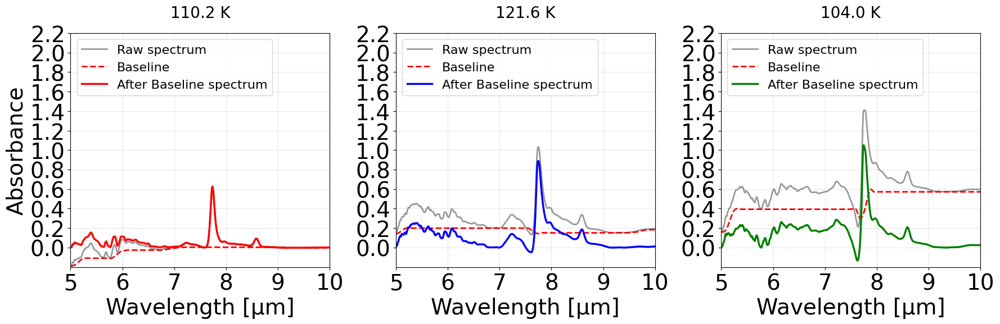

In [2]:
# 必要なライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import pandas as pd
from scipy.signal import find_peaks, savgol_filter

# フォントサイズの設定
rcParams['font.size'] = 14
rcParams['axes.labelsize'] = 16
rcParams['axes.titlesize'] = 18
rcParams['xtick.labelsize'] = 28
rcParams['ytick.labelsize'] = 28
rcParams['legend.fontsize'] = 12
rcParams['figure.titlesize'] = 20

# 改良版ベースライン補正関数
def refined_rolling_ball_baseline(y, base_window=100, iterations=3):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 2, base_window)

    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()

    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values

    smoothed_baseline = savgol_filter(baseline, window_length=31, polyorder=3)
    return smoothed_baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅推定関数（改良版）
def estimate_peak_width(y):
    peaks, _ = find_peaks(y, prominence=0.05)
    if len(peaks) >= 2:
        widths = np.diff(peaks)
        return int(np.median(widths))
    return 50

# データファイルのパス設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/annealing/zipdata/'
path_ref = base_path + 'ref/'

# 温度と時間ポイントの設定
selected_time_points = ['1413', '1440', '1513']
selected_temperature = [110.2, 121.6, 104.0]
temp_labels = ['110.2 K', '121.6 K', '104.0 K']

# 波長範囲の設定
yw_nm = np.arange(5000,15000,10)
yw = yw_nm / 1000
nw = len(yw)

# 空間分解能パラメータ
xst, yst = 150, 130
sbin = 28
x0 = np.arange(xst, xst+11*sbin, sbin)
y0 = np.arange(yst, yst+11*sbin, sbin)

# 中心領域のインデックス
center_i, center_j = 5, 5

# プロットの準備
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
plt.subplots_adjust(wspace=0.3)

# 各温度の処理
# 各温度の処理
for temp_idx, (temp, time_point, temp_label) in enumerate(zip(selected_temperature, selected_time_points, temp_labels)):
    print(f"Processing temperature {temp} K...")
    
    path_sam = base_path + time_point + '/'
    solid_ref = np.load(path_ref + 'ref.npy')
    solid_tg = np.load(path_sam + 'tg.npy')
    
    solid_absorb = np.log10(solid_ref / solid_tg)
    
    pix_x, pix_y = x0[center_j], y0[center_i]
    raw_spectrum = np.average(solid_absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
    
    baseline = refined_rolling_ball_baseline(raw_spectrum)
    corrected_spectrum = raw_spectrum - baseline
    
    # 温度に応じた色の設定
    if temp_idx == 0:  # 110.2 K
        after_baseline_color = 'red'
    elif temp_idx == 1:  # 121.6 K
        after_baseline_color = 'blue'
    else:  # 104.0 K
        after_baseline_color = 'green'
    
    ax = axes[temp_idx]
    ax.plot(yw, raw_spectrum, color='gray', linewidth=2.0, label='Raw spectrum', alpha=0.8)
    ax.plot(yw, baseline, color='red', linewidth=2.0, label='Baseline', linestyle='--')
    ax.plot(yw, corrected_spectrum, color=after_baseline_color, linewidth=2.5, label='After Baseline spectrum')
    
    # タイトルの設定
    if temp_idx == 0:
        ax.set_title('110.2 K', fontsize=20, pad=20)
    elif temp_idx == 1:
        ax.set_title('121.6 K', fontsize=20, pad=20)
    else:
        ax.set_title('104.0 K', fontsize=20, pad=20)
    
    ax.set_xlim([5, 10])
    ax.set_ylim([-0.2, 2.2])
    ax.grid(True, alpha=0.3)
    ax.set_xticks([5, 6, 7, 8, 9, 10])
    ax.set_xticklabels(['5', '6', '7', '8', '9', '10'])
    ax.set_yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0,1.2,1.4,1.6,1.8,2.0,2.2])
    ax.set_yticklabels(['0.0', '0.2', '0.4', '0.6', '0.8', '1.0','1.2','1.4','1.6','1.8','2.0','2.2'], fontsize=28)
    ax.set_xlabel('Wavelength [μm]', fontsize=28)
    
    if temp_idx == 0:
        ax.set_ylabel('Absorbance', fontsize=28)
    
    ax.legend(fontsize=16, loc='upper left')

plt.tight_layout()
plt.show()

Processing temperature 110.2 K...
Processing temperature 121.6 K...
Processing temperature 104.0 K...


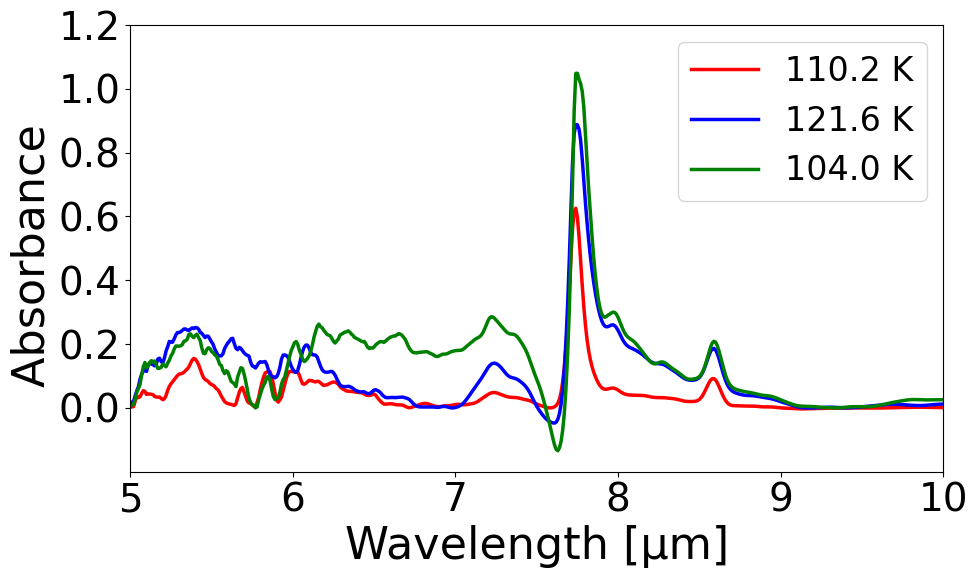

In [3]:
# 必要なライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import pandas as pd
from scipy.signal import find_peaks, savgol_filter

# フォントサイズの設定
rcParams['font.size'] = 14
rcParams['axes.labelsize'] = 16
rcParams['axes.titlesize'] = 18
rcParams['xtick.labelsize'] = 28
rcParams['ytick.labelsize'] = 28
rcParams['legend.fontsize'] = 12
rcParams['figure.titlesize'] = 20

# 改良版ベースライン補正関数
def refined_rolling_ball_baseline(y, base_window=100, iterations=3):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 2, base_window)

    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()

    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values

    smoothed_baseline = savgol_filter(baseline, window_length=31, polyorder=3)
    return smoothed_baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅推定関数（改良版）
def estimate_peak_width(y):
    peaks, _ = find_peaks(y, prominence=0.05)
    if len(peaks) >= 2:
        widths = np.diff(peaks)
        return int(np.median(widths))
    return 50

# データファイルのパス設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/annealing/zipdata/'
path_ref = base_path + 'ref/'

# 温度と時間ポイントの設定
selected_time_points = ['1413', '1440', '1513']
selected_temperature = [110.2, 121.6, 104.0]
temp_labels = ['110.2 K', '121.6 K', '104.0 K']
colors = ['red', 'blue', 'green']

# 波長範囲の設定
yw_nm = np.arange(5000,15000,10)
yw = yw_nm / 1000
nw = len(yw)

# 空間分解能パラメータ
xst, yst = 150, 130
sbin = 28
x0 = np.arange(xst, xst+11*sbin, sbin)
y0 = np.arange(yst, yst+11*sbin, sbin)

# 中心領域のインデックス
center_i, center_j = 5, 5

# 単一プロットの準備
plt.figure(figsize=(10, 6))

# 各温度の補正スペクトルをプロット
for temp_idx, (temp, time_point, temp_label, color) in enumerate(zip(selected_temperature, selected_time_points, temp_labels, colors)):
    print(f"Processing temperature {temp} K...")
    
    path_sam = base_path + time_point + '/'
    solid_ref = np.load(path_ref + 'ref.npy')
    solid_tg = np.load(path_sam + 'tg.npy')
    
    solid_absorb = np.log10(solid_ref / solid_tg)
    
    pix_x, pix_y = x0[center_j], y0[center_i]
    raw_spectrum = np.average(solid_absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
    
    baseline = refined_rolling_ball_baseline(raw_spectrum)
    corrected_spectrum = raw_spectrum - baseline
    
    plt.plot(yw, corrected_spectrum, color=color, linewidth=2.5, label=f'{temp_label}')

# 軸設定とラベル
plt.xlim([5, 10])
plt.ylim([-0.2, 1.2])
plt.xticks([5, 6, 7, 8, 9, 10])
plt.yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2])
plt.xlabel('Wavelength [μm]', fontsize=32)
plt.ylabel('Absorbance ', fontsize=32)
plt.legend(fontsize=24)
plt.tight_layout()
plt.show()

C:\Users\daiki\AppData\Local\Temp\ipykernel_24648\829082180.py:65: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('rainbow')


Processing i6-j6 transmission spectra...
Processing spectrum for time 0 min...
Processing spectrum for time 30 min...
Processing spectrum for time 60 min...
Processing spectrum for time 70 min...
Processing spectrum for time 80 min...
Processing spectrum for time 90 min...
Processing spectrum for time 120 min...
Processing spectrum for time 510 min...


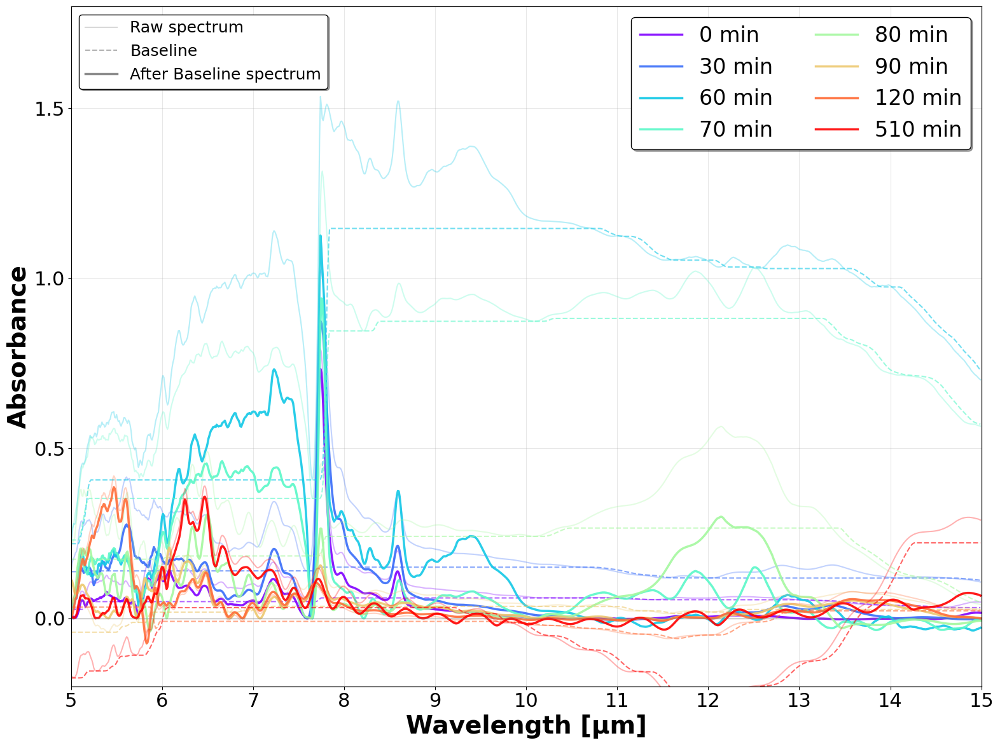

In [4]:
# 必要なライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import pandas as pd
import matplotlib.cm as cm

# フォントサイズの設定
rcParams['font.size'] = 16
rcParams['axes.labelsize'] = 18
rcParams['axes.titlesize'] = 20
rcParams['xtick.labelsize'] = 22
rcParams['ytick.labelsize'] = 22
rcParams['legend.fontsize'] = 14
rcParams['figure.titlesize'] = 22

# ベースライン補正関数
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅推定関数
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# データファイルパスの設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
path_ref = base_path + 'ref/'

# 測定時間点の設定
selected_times = [0, 30, 60, 70, 80, 90, 120, 510]
selected_time_points = ['1014', '1044', '1114', '1124', '1134', '1144', '1214', '1837']

# 波長範囲の設定
yw_nm = np.arange(5000, 15000, 10)
yw = yw_nm / 1000
nw = len(yw)

# 空間分解能パラメータ
xst, yst = 150, 130
sbin = 28
x0 = np.arange(xst, xst+11*sbin, sbin)
y0 = np.arange(yst, yst+11*sbin, sbin)

# 中心領域（i6-j6）のピクセル位置
i, j = 5, 5
pix_x, pix_y = x0[j], y0[i]

# カラーマップ設定（虹色）
cmap = cm.get_cmap('rainbow')
rainbow_colors = [cmap(i/7) for i in range(8)]

# 1つの図で全時間点のRaw, Baseline, After Baselineを表示
fig, ax = plt.subplots(figsize=(16, 12))

# スペクトル処理ループ
print("Processing i6-j6 transmission spectra...")
for time_idx, (time, time_point) in enumerate(zip(selected_times, selected_time_points)):
    print(f"Processing spectrum for time {time} min...")
    path_sam = base_path + time_point + '/'
    Zs_tg = np.load(path_sam + 'tg.npy')
    Zs_ref = np.load(path_ref + 'ref.npy')
    Absorb = np.log10(Zs_ref / Zs_tg)
    spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
    baseline = rolling_ball_baseline(spectrum)
    corrected_spectrum = spectrum - baseline
    
    color = rainbow_colors[time_idx]
    
    # Raw spectrum (薄い色)
    ax.plot(yw, spectrum, color=color, linewidth=1.5, alpha=0.3, 
            linestyle='-', label=f'{time} min Raw' if time_idx == 0 else "")
    
    # Baseline (破線)
    ax.plot(yw, baseline, color=color, linewidth=1.5, alpha=0.6, 
            linestyle='--', label=f'{time} min Baseline' if time_idx == 0 else "")
    
    # After Baseline spectrum (太い実線)
    ax.plot(yw, corrected_spectrum, color=color, linewidth=2.5, alpha=0.9, 
            linestyle='-', label=f'{time} min')

# グラフ設定
ax.set_xlim([5, 15])
ax.set_ylim([-0.2, 1.8])
ax.grid(True, alpha=0.3)
ax.set_xticks(np.arange(5, 16, 1))
ax.set_yticks([0, 0.5, 1.0, 1.5])
ax.set_xlabel('Wavelength [μm]', fontsize=28, weight='bold')
ax.set_ylabel('Absorbance', fontsize=28, weight='bold')

# 凡例の設定（時間のみ表示）
time_handles = []
time_labels = []
for time_idx, time in enumerate(selected_times):
    line = plt.Line2D([0], [0], color=rainbow_colors[time_idx], linewidth=2.5, alpha=0.9)
    time_handles.append(line)
    time_labels.append(f'{time} min')

ax.legend(time_handles, time_labels, fontsize=24, loc='upper right', ncol=2, 
          frameon=True, edgecolor='black', fancybox=True, shadow=True)

# 追加の説明用凡例（Raw, Baseline, After Baseline）
legend_elements = [
    plt.Line2D([0], [0], color='gray', linewidth=1.5, alpha=0.3, label='Raw spectrum'),
    plt.Line2D([0], [0], color='gray', linewidth=1.5, alpha=0.6, linestyle='--', label='Baseline'),
    plt.Line2D([0], [0], color='gray', linewidth=2.5, alpha=0.9, label='After Baseline spectrum')
]
ax2 = ax.twinx()
ax2.set_yticks([])
ax2.legend(handles=legend_elements, fontsize=18, loc='upper left', frameon=True,
           edgecolor='black', fancybox=True, shadow=True)

ax.axhline(y=0, color='gray', linestyle='-', alpha=0.5, linewidth=1)
plt.tight_layout()
plt.show()

C:\Users\daiki\AppData\Local\Temp\ipykernel_27300\249641597.py:65: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('rainbow')


Processing i6-j6 transmission spectra...
Processing spectrum for time 0 min...
Processing spectrum for time 30 min...
Processing spectrum for time 60 min...
Processing spectrum for time 70 min...
Processing spectrum for time 80 min...
Processing spectrum for time 90 min...
Processing spectrum for time 120 min...
Processing spectrum for time 510 min...


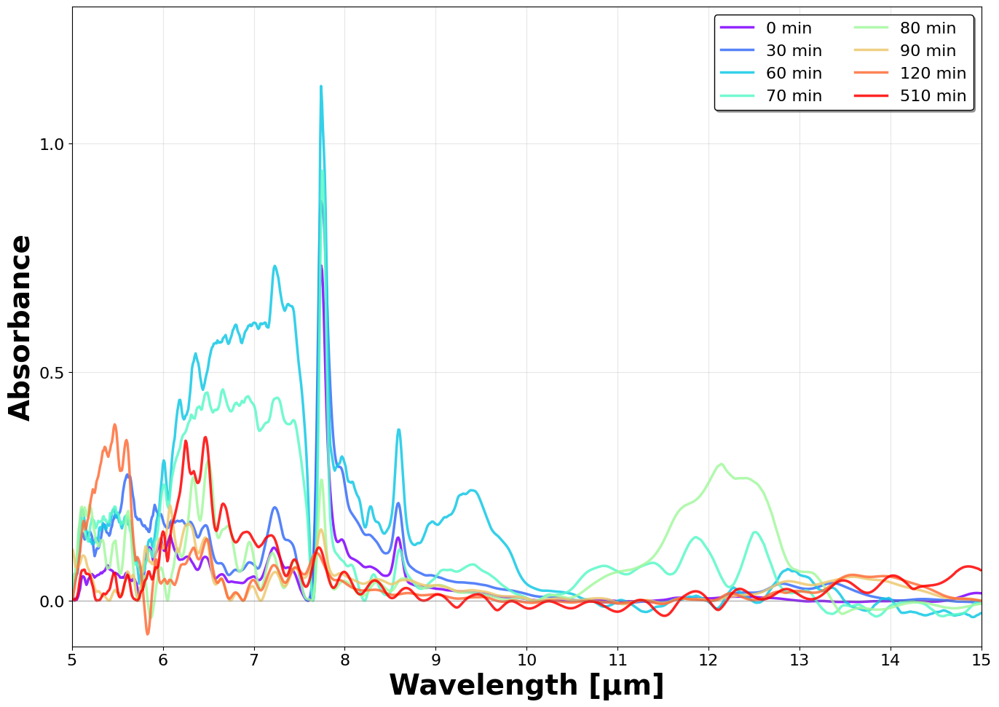

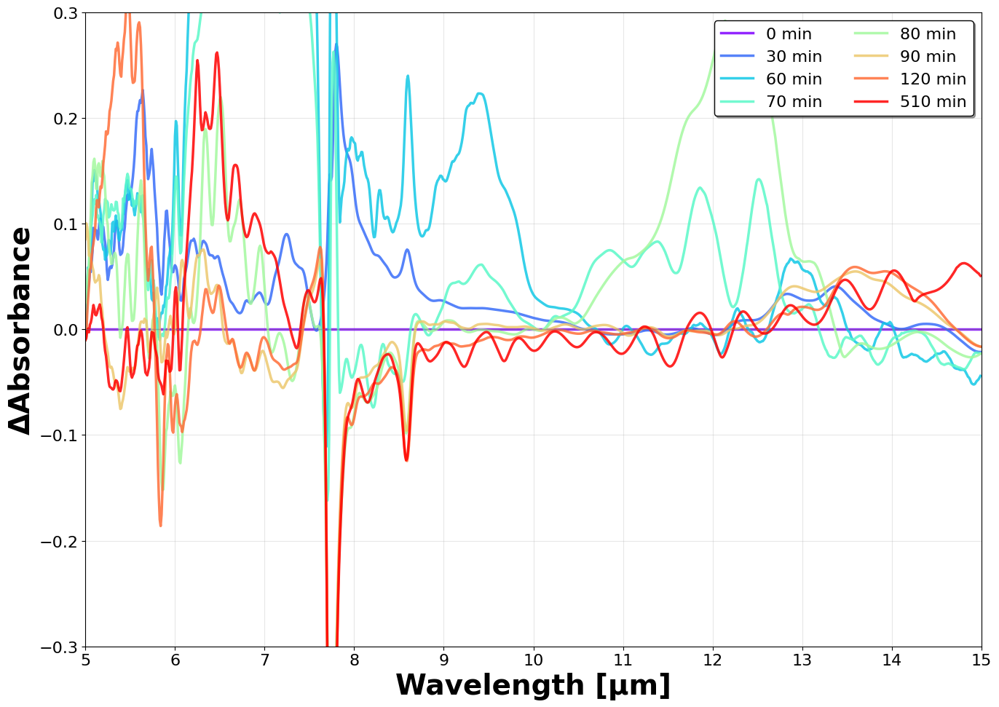

In [1]:
# 必要なライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import pandas as pd
import matplotlib.cm as cm

# フォントサイズの設定
rcParams['font.size'] = 16
rcParams['axes.labelsize'] = 18
rcParams['axes.titlesize'] = 20
rcParams['xtick.labelsize'] = 16
rcParams['ytick.labelsize'] = 16
rcParams['legend.fontsize'] = 14
rcParams['figure.titlesize'] = 22

# ベースライン補正関数
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
    window_sizes = [adaptive_window // 2, adaptive_window, adaptive_window * 2]
    for size in window_sizes:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅推定関数
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    if len(peaks) >= 2:
        peak_widths = np.diff(peaks)
        return int(np.median(peak_widths))
    return 50

# データファイルパスの設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
path_ref = base_path + 'ref/'

# 測定時間点の設定
selected_times = [0, 30, 60, 70, 80, 90, 120, 510]
selected_time_points = ['1014', '1044', '1114', '1124', '1134', '1144', '1214', '1837']

# 波長範囲の設定
yw_nm = np.arange(5000, 15000, 10)
yw = yw_nm / 1000
nw = len(yw)

# 空間分解能パラメータ
xst, yst = 150, 130
sbin = 28
x0 = np.arange(xst, xst+11*sbin, sbin)
y0 = np.arange(yst, yst+11*sbin, sbin)

# 中心領域（i6-j6）のピクセル位置
i, j = 5, 5
pix_x, pix_y = x0[j], y0[i]

# カラーマップ設定（虹色）
cmap = cm.get_cmap('rainbow')
rainbow_colors = [cmap(i/7) for i in range(8)]

# スペクトル保存用辞書
time_spectra = {}
diff_spectra = {}

# スペクトル処理ループ
print("Processing i6-j6 transmission spectra...")
for time_idx, (time, time_point) in enumerate(zip(selected_times, selected_time_points)):
    print(f"Processing spectrum for time {time} min...")
    path_sam = base_path + time_point + '/'
    Zs_tg = np.load(path_sam + 'tg.npy')
    Zs_ref = np.load(path_ref + 'ref.npy')
    Absorb = np.log10(Zs_ref / Zs_tg)
    spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
    baseline = rolling_ball_baseline(spectrum)
    corrected_spectrum = spectrum - baseline
    time_spectra[time] = corrected_spectrum

# 差スペクトルの計算（0分を基準）
corrected_spectrum_0 = time_spectra[0]
for time in selected_times:
    diff_spectra[time] = time_spectra[time] - corrected_spectrum_0

# 1. 補正スペクトルの描画
fig1, ax1 = plt.subplots(figsize=(14, 10))
for time_idx, time in enumerate(selected_times):
    ax1.plot(yw, time_spectra[time], color=rainbow_colors[time_idx],
             linewidth=2.5, label=f'{time} min', alpha=0.85)
ax1.set_xlim([5, 15])
ax1.set_ylim([-0.1, 1.3])
ax1.grid(True, alpha=0.3)
ax1.set_xticks(np.arange(5, 16, 1))
ax1.set_yticks([0, 0.5, 1.0])
ax1.set_xlabel('Wavelength [μm]', fontsize=28, weight='bold')
ax1.set_ylabel('Absorbance', fontsize=28, weight='bold')
ax1.legend(fontsize=16, loc='upper right', ncol=2, frameon=True,
           edgecolor='black', fancybox=True, shadow=True)
ax1.axhline(y=0, color='gray', linestyle='-', alpha=0.5, linewidth=1)
plt.tight_layout()
plt.show()

# 2. 差スペクトルの描画
fig2, ax2 = plt.subplots(figsize=(14, 10))
for time_idx, time in enumerate(selected_times):
    ax2.plot(yw, diff_spectra[time], color=rainbow_colors[time_idx],
             linewidth=2.5, label=f'{time} min', alpha=0.85)
ax2.set_xlim([5, 15])
ax2.set_ylim([-0.3, 0.3])
ax2.grid(True, alpha=0.3)
ax2.set_xticks(np.arange(5, 16, 1))
ax2.set_yticks(np.arange(-0.3, 0.31, 0.1))
ax2.set_xlabel('Wavelength [μm]', fontsize=28, weight='bold')
ax2.set_ylabel('ΔAbsorbance', fontsize=28, weight='bold')
ax2.legend(fontsize=16, loc='upper right', ncol=2, frameon=True,
           edgecolor='black', fancybox=True, shadow=True)
ax2.axhline(y=0, color='gray', linestyle='-', alpha=0.5, linewidth=1)
plt.tight_layout()
plt.show()

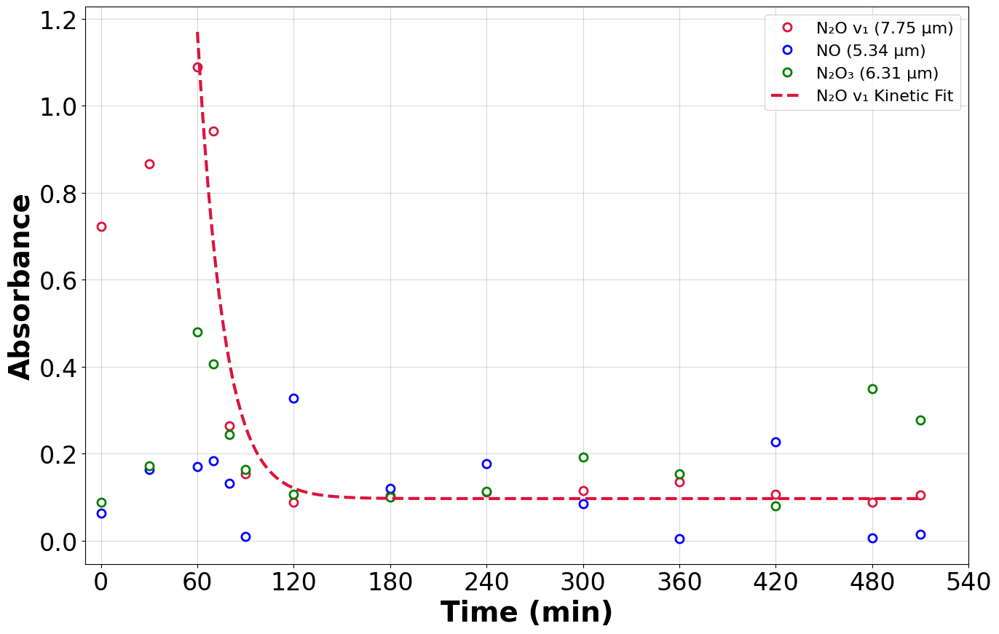


=== N₂O v₁ 反応速度論的フィッティング結果 ===
k1 (分解速度定数): 0.000913 /s
k2 (再結合速度定数): 0.000076 /s
初期N2O濃度: 1.1698
初期N2濃度: 0.0000
初期O濃度: 0.0000
Half-life: 12.9 min (774 s)
R²: 0.9179
Initial (60 min): 1.0888, Final (510 min): 0.1053
Decrease ratio: 90.3%

=== パラメータの標準誤差 ===
k1 error: ±0.000707 /s
k2 error: ±0.001691 /s
N2O_0 error: ±0.1255
N2_0 error: ±10678767.5196
O_0 error: ±10678764.6760

=== 反応速度論的モデル vs 指数減衰モデル比較 ===
反応速度論的モデル R²: 0.9179
指数減衰モデル R²: 0.9154
反応速度論的モデルの方が実験データによく適合しています。

AIC比較:
反応速度論的モデル AIC: -46.23
指数減衰モデル AIC: -49.87
AIC基準では指数減衰モデルが優れています。

=== フィッティング解析完了 ===


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import pandas as pd
from scipy.optimize import curve_fit
from scipy.integrate import solve_ivp

# フォント設定
rcParams.update({
    'font.size': 16,
    'axes.labelsize': 18,
    'axes.titlesize': 20,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 16,
    'figure.titlesize': 22
})

# ベースライン補正
def rolling_ball_baseline(y, window_size=150, iterations=5):
    peak_width = estimate_peak_width(y)
    adaptive_window = max(peak_width * 3, window_size)
    y_ext = np.pad(y, (adaptive_window//2, adaptive_window//2), mode='reflect')
    baseline = y_ext.copy()
    for size in [adaptive_window // 2, adaptive_window, adaptive_window * 2]:
        for _ in range(iterations):
            rolling_min = pd.Series(baseline).rolling(window=size, center=True, min_periods=1).min()
            rolling_max = pd.Series(rolling_min).rolling(window=size, center=True, min_periods=1).max()
            baseline = rolling_max.values
    baseline = pd.Series(baseline).rolling(window=5, center=True, min_periods=1).mean().values
    return baseline[adaptive_window//2:-adaptive_window//2]

# ピーク幅推定
def estimate_peak_width(y):
    gradient = np.gradient(y)
    peaks = np.where(np.diff(np.sign(gradient)))[0]
    return int(np.median(np.diff(peaks))) if len(peaks) >= 2 else 50

# 吸光度抽出
def extract_absorbance_at_wavelength(spectrum, wavelength_array, target_wavelength):
    idx = np.argmin(np.abs(wavelength_array - target_wavelength))
    return spectrum[idx]

# 反応速度論的微分方程式システム
def reaction_kinetics(t, y, k1, k2):
    """
    反応方程式:
    d[N2O]/dt = -k1[N2O] + k2[N2][O]
    d[N2]/dt = k1[N2O] - k2[N2][O]
    d[O]/dt = k1[N2O] - k2[N2][O]
    """
    N2O, N2, O = y
    
    dN2O_dt = -k1 * N2O + k2 * N2 * O
    dN2_dt = k1 * N2O - k2 * N2 * O
    dO_dt = k1 * N2O - k2 * N2 * O
    
    return [dN2O_dt, dN2_dt, dO_dt]

# フィッティング用の関数（N2Oの濃度のみを返す）
def n2o_kinetic_model(t, k1, k2, N2O_0, N2_0, O_0):
    """
    微分方程式を解いてN2O濃度の時間変化を返す
    """
    # 初期条件
    y0 = [N2O_0, N2_0, O_0]
    
    # 微分方程式を解く
    sol = solve_ivp(
        lambda t_val, y_val: reaction_kinetics(t_val, y_val, k1, k2),
        [0, t[-1]],
        y0,
        t_eval=t,
        method='RK45',
        rtol=1e-8,
        atol=1e-10
    )
    
    # N2O濃度のみを返す
    return sol.y[0]

# 波長データ（nm → µm）
wavelength_data = {
    7750: 'N₂O v₁',
    5340: 'NO',
    6310: 'N₂O₃',
}
target_wavelengths = {name: wl / 1000 for wl, name in wavelength_data.items()}

# 時間点とファイル名
selected_times = [0, 30, 60, 70, 80, 90, 120, 180, 240, 300, 360, 420, 480, 510]
selected_time_points = ['1014', '1044', '1114', '1124', '1134', '1144', '1214',
                        '1314', '1414', '1514', '1614', '1714', '1814', '1837']

# 波長軸
yw_nm = np.arange(5000, 15000, 10)
yw = yw_nm / 1000

# 空間分解能
xst, yst, sbin = 150, 130, 28
x0 = np.arange(xst, xst+11*sbin, sbin)
y0 = np.arange(yst, yst+11*sbin, sbin)
i, j = 5, 5
pix_x, pix_y = x0[j], y0[i]

# データパス
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
path_ref = base_path + 'ref/'

# 吸光度格納
absorbance_data = {name: [] for name in target_wavelengths}

# 各時間点で処理
for time, time_point in zip(selected_times, selected_time_points):
    path_sam = base_path + time_point + '/'
    Zs_tg = np.load(path_sam + 'tg.npy')
    Zs_ref = np.load(path_ref + 'ref.npy')
    Absorb = np.log10(Zs_ref / Zs_tg)
    spectrum = np.average(Absorb[:, pix_y:pix_y+sbin, pix_x:pix_x+sbin], axis=(1,2))
    baseline = rolling_ball_baseline(spectrum)
    corrected_spectrum = spectrum - baseline
    for name, wl in target_wavelengths.items():
        absorbance = extract_absorbance_at_wavelength(corrected_spectrum, yw, wl)
        absorbance_data[name].append(absorbance)

# N₂O v₁ 反応速度論的フィッティング
fit_name = 'N₂O v₁'
fit_start_index = selected_times.index(60)
selected_times_fit = np.array(selected_times[fit_start_index:])
selected_times_fit_relative = selected_times_fit - 60  # 60分を0とする
y_fit = np.array(absorbance_data[fit_name][fit_start_index:])

# 初期パラメータの推定
# 吸光度を相対濃度として扱う（正規化）
N2O_0_init = y_fit[0]  # 初期N2O濃度
N2_0_init = 0.1 * N2O_0_init  # 初期N2濃度（推定）
O_0_init = 0.1 * N2O_0_init   # 初期O濃度（推定）
k1_init = 0.01  # 分解速度定数の初期値 (min^-1)
k2_init = 0.001  # 再結合速度定数の初期値 (min^-1)

# パラメータの境界設定
bounds = (
    [1e-6, 1e-6, 0.1*N2O_0_init, 0, 0],  # 下限
    [1.0, 1.0, 2*N2O_0_init, N2O_0_init, N2O_0_init]  # 上限
)

try:
    # 反応速度論的フィッティング
    popt_kinetic, pcov_kinetic = curve_fit(
        n2o_kinetic_model,
        selected_times_fit_relative,
        y_fit,
        p0=[k1_init, k2_init, N2O_0_init, N2_0_init, O_0_init],
        bounds=bounds,
        maxfev=10000
    )
    
    k1_fit, k2_fit, N2O_0_fit, N2_0_fit, O_0_fit = popt_kinetic
    
    # フィッティング曲線の生成
    time_fit_fine = np.linspace(0, 450, 200)
    n2o_fit = n2o_kinetic_model(time_fit_fine, *popt_kinetic)
    time_fit_abs = time_fit_fine + 60
    
    # 色設定
    colors = ['crimson', 'blue', 'green', 'orange', 'purple', 'brown', 'red', 'teal', 'darkcyan', 'magenta', 'gold', 'gray', 'navy', 'olive']
    color_map = dict(zip(target_wavelengths.keys(), colors))
    
    # グラフ描画（点のみ＋N₂O v₁反応速度論的フィット）
    fig, ax = plt.subplots(figsize=(14, 9))
    for name in target_wavelengths:
        ax.plot(selected_times, absorbance_data[name], 'o', color=color_map[name], markersize=8,
                markerfacecolor='white', markeredgewidth=2,
                label=f'{name} ({target_wavelengths[name]:.2f} µm)')
    
    # N₂O v₁ 反応速度論的フィッティング曲線
    ax.plot(time_fit_abs, n2o_fit, '--', color=color_map[fit_name], linewidth=3, 
            label=f'{fit_name} Kinetic Fit')

    #    # グラフ装飾
    ax.grid(True, color='gray', alpha=0.3)
    ax.set_xlim([-10, 520])
    ax.set_xticks(np.arange(0, 541, 60))
    ax.set_xticklabels([str(t) for t in np.arange(0, 541, 60)], fontsize=24)
    ax.tick_params(axis='y', labelsize=24)
    ax.set_xlabel('Time (min)', fontsize=28, weight='bold')
    ax.set_ylabel('Absorbance', fontsize=28, weight='bold')
    ax.legend(loc='upper right', fontsize=16)
    plt.tight_layout()
    plt.show()
    
    # 数値出力（反応速度論的フィッティング結果）
    y_pred = n2o_kinetic_model(selected_times_fit_relative, *popt_kinetic)
    r2_kinetic = 1 - np.sum((y_fit - y_pred)**2) / np.sum((y_fit - np.mean(y_fit))**2)
    
    # 半減期の計算（近似的）
    half_value = N2O_0_fit / 2
    time_fine = np.linspace(0, 1000, 10000)
    n2o_fine = n2o_kinetic_model(time_fine, *popt_kinetic)
    half_life_idx = np.argmin(np.abs(n2o_fine - half_value))
    half_life_min = time_fine[half_life_idx]
    half_life_sec = half_life_min * 60
    
    print(f"\n=== {fit_name} 反応速度論的フィッティング結果 ===")
    print(f"k1 (分解速度定数): {k1_fit/60:.6f} /s")
    print(f"k2 (再結合速度定数): {k2_fit/60:.6f} /s")
    print(f"初期N2O濃度: {N2O_0_fit:.4f}")
    print(f"初期N2濃度: {N2_0_fit:.4f}")
    print(f"初期O濃度: {O_0_fit:.4f}")
    print(f"Half-life: {half_life_min:.1f} min ({half_life_sec:.0f} s)")
    print(f"R²: {r2_kinetic:.4f}")
    print(f"Initial (60 min): {y_fit[0]:.4f}, Final (510 min): {y_fit[-1]:.4f}")
    print(f"Decrease ratio: {(1 - y_fit[-1]/y_fit[0])*100:.1f}%")
    
    # パラメータの標準誤差
    param_errors = np.sqrt(np.diag(pcov_kinetic))
    print(f"\n=== パラメータの標準誤差 ===")
    print(f"k1 error: ±{param_errors[0]/60:.6f} /s")
    print(f"k2 error: ±{param_errors[1]/60:.6f} /s")
    print(f"N2O_0 error: ±{param_errors[2]:.4f}")
    print(f"N2_0 error: ±{param_errors[3]:.4f}")
    print(f"O_0 error: ±{param_errors[4]:.4f}")

except Exception as e:
    print(f"反応速度論的フィッティングでエラーが発生しました: {e}")
    print("単純な指数減衰フィッティングにフォールバックします...")
    
    # 指数減衰関数（フォールバック）
    def exponential_decay(t, A, k, C):
        return A * np.exp(-k * t) + C
    
    A_init = y_fit[0] - y_fit[-1]
    k_init = 0.01
    C_init = y_fit[-1]
    popt, _ = curve_fit(exponential_decay, selected_times_fit_relative, y_fit,
                        p0=[A_init, k_init, C_init], maxfev=5000)
    A_fit, k_fit, C_fit = popt
    time_fit_rel = np.linspace(0, 450, 100)
    time_fit_abs = time_fit_rel + 60
    absorbance_fit = exponential_decay(time_fit_rel, A_fit, k_fit, C_fit)
    
    # グラフ描画（点のみ＋N₂O v₁フィット）
    fig, ax = plt.subplots(figsize=(14, 9))
    for name in target_wavelengths:
        ax.plot(selected_times, absorbance_data[name], 'o', color=color_map[name], markersize=8,
                markerfacecolor='white', markeredgewidth=2,
                label=f'{name} ({target_wavelengths[name]:.2f} µm)')

    # N₂O v₁ フィッティング曲線
    ax.plot(time_fit_abs, absorbance_fit, '--', color=color_map[fit_name], linewidth=2, label=f'{fit_name} Fit')

    # グラフ装飾
    ax.grid(True, color='gray', alpha=0.3)
    ax.set_xlim([-10, 520])
    ax.set_xticks(np.arange(0, 541, 60))
    ax.set_xticklabels([str(t) for t in np.arange(0, 541, 60)], fontsize=24)
    ax.tick_params(axis='y', labelsize=24)
    ax.set_xlabel('Time (min)', fontsize=28, weight='bold')
    ax.set_ylabel('Absorbance', fontsize=28, weight='bold')
    ax.legend(loc='upper right', fontsize=16)
    plt.tight_layout()
    plt.show()
    
    # 数値出力（指数減衰フィッティング結果）
    r2 = 1 - np.sum((y_fit - exponential_decay(selected_times_fit_relative, *popt))**2) / np.sum((y_fit - np.mean(y_fit))**2)
    half_life_min = np.log(2) / k_fit
    half_life_sec = np.log(2) / (k_fit / 60)
    print(f"\n=== {fit_name} 指数減衰フィッティング結果（フォールバック） ===")
    print(f"A: {A_fit:.4f}, k: {k_fit:.6f} /s, C: {C_fit:.4f}")
    print(f"Half-life: {half_life_min:.1f} min ({half_life_sec:.0f} s)")
    print(f"R²: {r2:.4f}")
    print(f"Initial (60 min): {y_fit[0]:.4f}, Final (510 min): {y_fit[-1]:.4f}")
    print(f"Decrease ratio: {(1 - y_fit[-1]/y_fit[0])*100:.1f}%")

# 反応速度論的解析の比較（成功した場合のみ）
try:
    if 'popt_kinetic' in locals():
        print(f"\n=== 反応速度論的モデル vs 指数減衰モデル比較 ===")
        
        # 指数減衰モデルでの再フィッティング（比較用）
        def exponential_decay_comp(t, A, k, C):
            return A * np.exp(-k * t) + C
        
        popt_exp, _ = curve_fit(exponential_decay_comp, selected_times_fit_relative, y_fit,
                               p0=[y_fit[0] - y_fit[-1], 0.01, y_fit[-1]], maxfev=5000)
        
        y_pred_exp = exponential_decay_comp(selected_times_fit_relative, *popt_exp)
        r2_exp = 1 - np.sum((y_fit - y_pred_exp)**2) / np.sum((y_fit - np.mean(y_fit))**2)
        
        print(f"反応速度論的モデル R²: {r2_kinetic:.4f}")
        print(f"指数減衰モデル R²: {r2_exp:.4f}")
        
        if r2_kinetic > r2_exp:
            print("反応速度論的モデルの方が実験データによく適合しています。")
        else:
            print("指数減衰モデルの方が実験データによく適合しています。")
            
        # AIC（赤池情報量規準）による比較
        n = len(y_fit)
        
        # 反応速度論的モデル（5パラメータ）
        rss_kinetic = np.sum((y_fit - y_pred)**2)
        aic_kinetic = n * np.log(rss_kinetic/n) + 2 * 5
        
        # 指数減衰モデル（3パラメータ）
        rss_exp = np.sum((y_fit - y_pred_exp)**2)
        aic_exp = n * np.log(rss_exp/n) + 2 * 3
        
        print(f"\nAIC比較:")
        print(f"反応速度論的モデル AIC: {aic_kinetic:.2f}")
        print(f"指数減衰モデル AIC: {aic_exp:.2f}")
        
        if aic_kinetic < aic_exp:
            print("AIC基準では反応速度論的モデルが優れています。")
        else:
            print("AIC基準では指数減衰モデルが優れています。")
            
except:
    print("モデル比較でエラーが発生しました。")

print("\n=== フィッティング解析完了 ===")

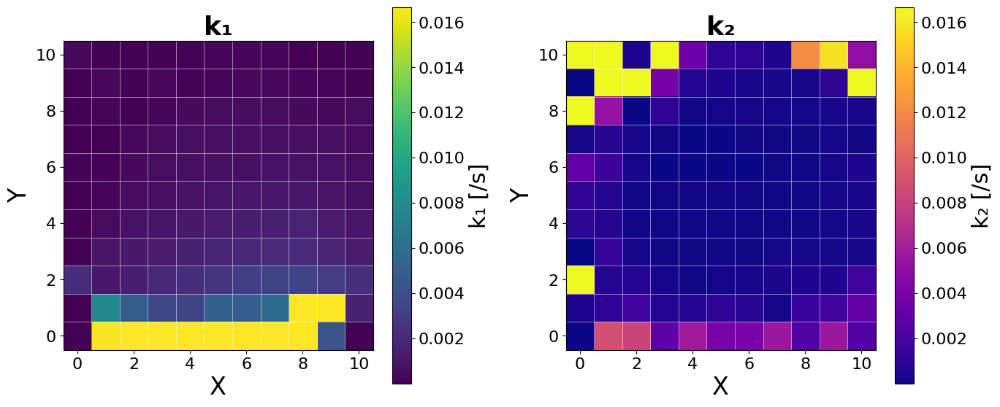

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams

# Font settings
rcParams.update({
    'font.size': 16,
    'axes.labelsize': 18,
    'axes.titlesize': 20,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 16,
    'figure.titlesize': 22
})

# Load map data
k1_map = np.load('k1_map_11x11.npy')
k2_map = np.load('k2_map_11x11.npy')

# Create figure for k₁ and k₂ maps
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# k₁ map (dissociation rate constant)
im1 = axes[0].imshow(k1_map, cmap='viridis', origin='lower', aspect='equal')
axes[0].set_title('k₁', fontsize=26, weight='bold')
axes[0].set_xlabel('X', fontsize=24)
axes[0].set_ylabel('Y', fontsize=24)
for i in range(12):
    axes[0].axhline(i-0.5, color='white', linewidth=0.5, alpha=0.7)
    axes[0].axvline(i-0.5, color='white', linewidth=0.5, alpha=0.7)
cbar1 = plt.colorbar(im1, ax=axes[0])
cbar1.set_label('k₁ [/s]', fontsize=22)

# k₂ map (recombination rate constant)
im2 = axes[1].imshow(k2_map, cmap='plasma', origin='lower', aspect='equal')
axes[1].set_title('k₂', fontsize=26, weight='bold')
axes[1].set_xlabel('X', fontsize=24)
axes[1].set_ylabel('Y', fontsize=24)
for i in range(12):
    axes[1].axhline(i-0.5, color='white', linewidth=0.5, alpha=0.7)
    axes[1].axvline(i-0.5, color='white', linewidth=0.5, alpha=0.7)
cbar2 = plt.colorbar(im2, ax=axes[1])
cbar2.set_label('k₂ [/s]', fontsize=22)

plt.tight_layout()
plt.show()


c:\Users\daiki\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\integrate\_ivp\radau.py:332: LinAlgWarning: Diagonal number 3 is exactly zero. Singular matrix.
  return lu_factor(A, overwrite_a=True)


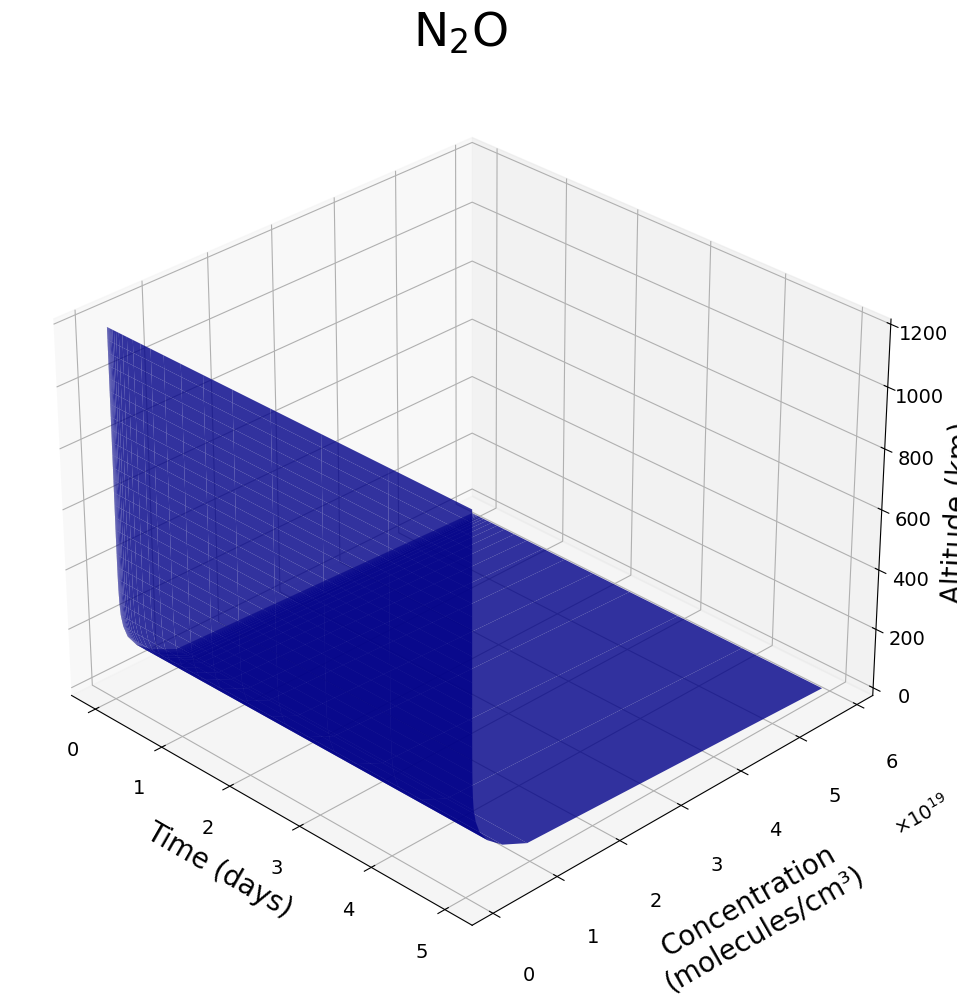

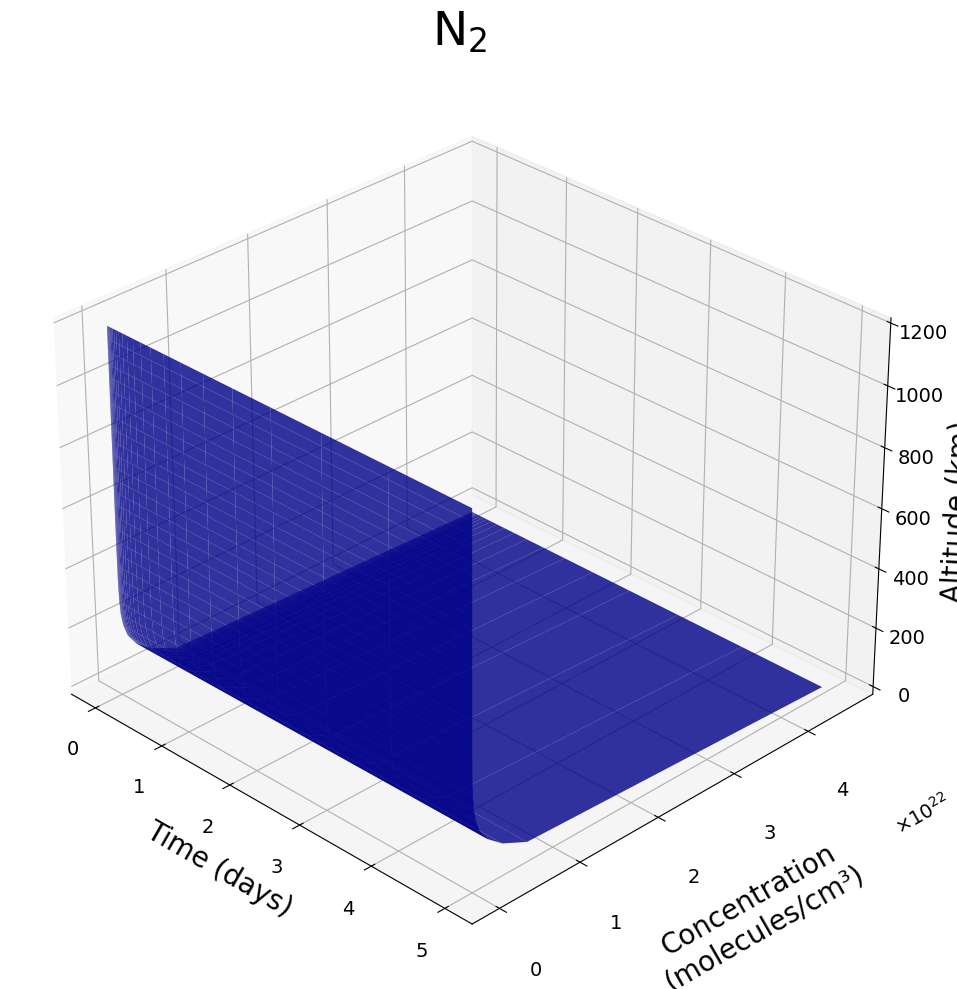

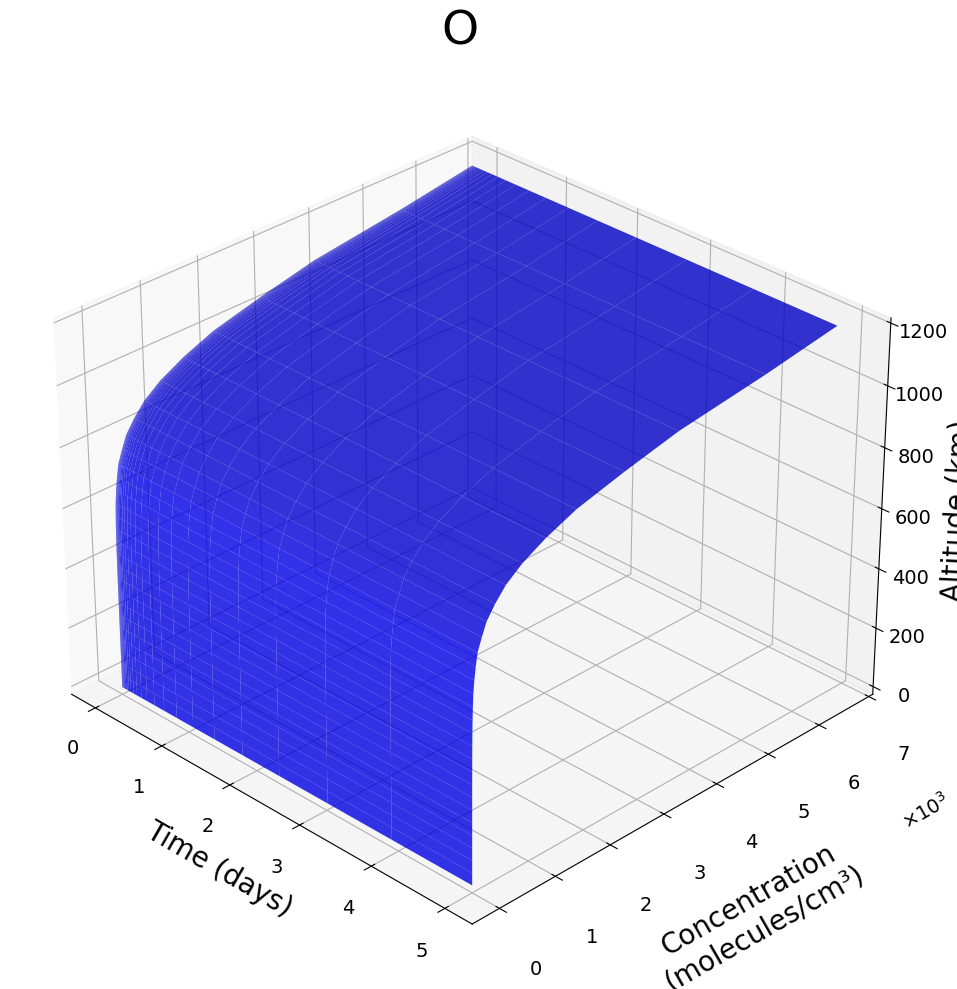

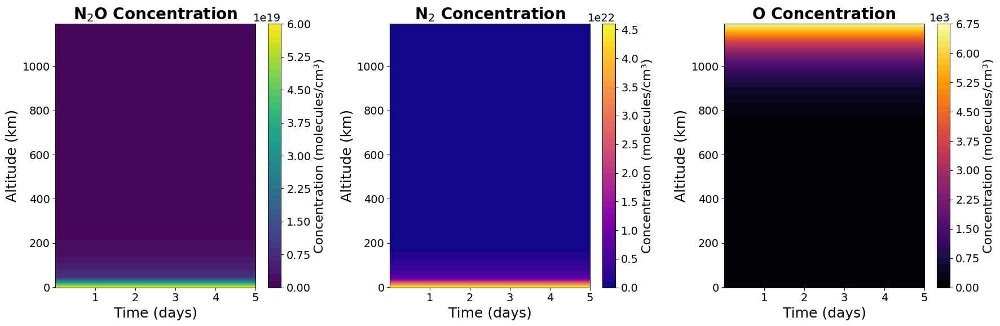

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# データの読み込み
path_ref = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/ref/'
path_sam = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/1114/'
Zs_tg = np.load(path_sam + 'tg.npy')
Zs_ref = np.load(path_ref + 'ref.npy')
Absorb = np.log10(Zs_ref / Zs_tg)

# N2プロファイルデータの読み込み
pluto_n2_profile = pd.read_csv('Pluto_N2.csv')
triton_n2_profile = pd.read_csv('Triton_N2.csv')

# フォント設定
plt.rcParams.update({
    'font.size': 14,
    'axes.labelsize': 16,
    'axes.titlesize': 18,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 34,
    'figure.titlesize': 20
})

# 反応速度定数（実験値）
k1 = 9e-4  # s^-1
k2 = 8e-5  # s^-1

def reaction_kinetics_3d(y, t, k1, k2):
    N2O, N2, O = y
    dN2O_dt = -k1 * N2O + k2 * N2 * O
    dN2_dt = k1 * N2O - k2 * N2 * O
    dO_dt = k1 * N2O - k2 * N2 * O
    return [dN2O_dt, dN2_dt, dO_dt]

def get_initial_conditions(altitude, body='pluto'):
    if body == 'pluto':
        n2_profile = pluto_n2_profile['1927028532714302.2'].values
        alt_profile = pluto_n2_profile[' -1.5410655686705468'].values
        n2_initial = 4.57e22
        o_initial = 5.76e19
    else:
        n2_profile = triton_n2_profile['3018455797376464.5'].values
        alt_profile = triton_n2_profile[' 0'].values
        n2_initial = 3.76e22
        o_initial = 4.73e19

    norm_factor = np.interp(altitude, alt_profile, n2_profile) / np.max(n2_profile)
    n2o_initial = 1e18
    return np.array([n2o_initial, n2_initial * norm_factor, o_initial * norm_factor])

def simulate_reactions(k_constants, altitudes, t_span=(0, 432000), body='pluto'):
    t_eval = np.logspace(0, np.log10(t_span[1]), 1000)
    results = []

    for alt in altitudes:
        y0 = get_initial_conditions(alt, body)
        k1, k2 = k_constants

        sol = solve_ivp(
            lambda t, y: reaction_kinetics_3d(y, t, k1, k2),
            t_span,
            y0,
            method='Radau',
            t_eval=t_eval,
            rtol=1e-4,
            atol=1e-6
        )

        if sol.success and sol.y.shape == (3, len(t_eval)):
            results.append(sol.y)
        else:
            print(f"Integration failed at altitude {alt:.1f} km — inserting NaNs")
            results.append(np.full((3, len(t_eval)), np.nan))

    return t_eval, np.stack(results)

# 高度範囲をプロファイルの最大値まで設定
alt_profile = pluto_n2_profile[' -1.5410655686705468'].values
max_altitude = np.max(alt_profile)
min_altitude = np.min(alt_profile)
heights = np.linspace(min_altitude, max_altitude, 30)

# シミュレーション実行
t_eval, results = simulate_reactions((k1, k2), heights, body='pluto')

# 各化学種のデータを分離
n2o_data = results[:, 0, :]
n2_data = results[:, 1, :]
o_data = results[:, 2, :]

# メッシュグリッド作成
T, H = np.meshgrid(t_eval / (3600 * 24), heights)

# 3Dプロット関数（修正版）
def plot_3d_surface(data, title, color='blue'):
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    surf = ax.plot_surface(T, data, H, color=color, alpha=0.8, linewidth=0, antialiased=True)

    ax.set_xlabel('Time (days)', labelpad=15, fontsize=20)
    ax.set_ylabel('Concentration\n(molecules/cm³)', labelpad=40, fontsize=20)
    ax.set_zlabel('Altitude (km)', labelpad=10, fontsize=20)
    ax.set_title(title, pad=20, fontsize=34)

    ax.ticklabel_format(style='scientific', axis='y', scilimits=(0,0), useMathText=True)
    ax.yaxis.get_offset_text().set_position((0, 1.02))
    ax.yaxis.get_offset_text().set_horizontalalignment('left')

    ax.tick_params(axis='x', pad=10, labelsize=14)
    ax.tick_params(axis='y', pad=20, labelsize=14)
    ax.tick_params(axis='z', pad=5, labelsize=14)
    ax.view_init(elev=30, azim=-45)
    ax.grid(True, linestyle='--', alpha=0.5)
    plt.subplots_adjust(left=0.02, right=0.98, top=0.95, bottom=0.05)
    plt.show()

# 3Dプロット表示（修正版）
plot_3d_surface(n2o_data, 'N$_2$O')
plot_3d_surface(n2_data, 'N$_2$')
plot_3d_surface(o_data, 'O')

# 2D等高線プロット（修正版）
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

contours = [
    (n2o_data, 'viridis', 'N$_2$O Concentration'),
    (n2_data, 'plasma', 'N$_2$ Concentration'),
    (o_data, 'inferno', 'O Concentration')
]

for i, (data, cmap, title) in enumerate(contours):
    contour = axes[i].contourf(T, H, data, levels=50, cmap=cmap)
    axes[i].set_xlabel('Time (days)', fontsize=18)
    axes[i].set_ylabel('Altitude (km)', fontsize=18)
    axes[i].set_title(title, fontsize=20, weight='bold')
    cbar = plt.colorbar(contour, ax=axes[i])
    cbar.set_label('Concentration (molecules/cm³)', fontsize=16)
    cbar.formatter.set_powerlimits((0, 0))
    cbar.update_ticks()
    axes[i].tick_params(labelsize=14)

plt.tight_layout()
plt.show()


=== UV吸光度解析（3波長対応） ===

=== 平均吸光度結果 ===

N₂O ice v₁ (7750nm):
  全体平均吸光度: 0.1722
  円内平均吸光度: 0.6420
  最大吸光度: 2.7217
  最小吸光度: -2.0158


C:\Users\daiki\AppData\Local\Temp\ipykernel_27300\2743148985.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.ax.set_yticklabels(tick_labels)


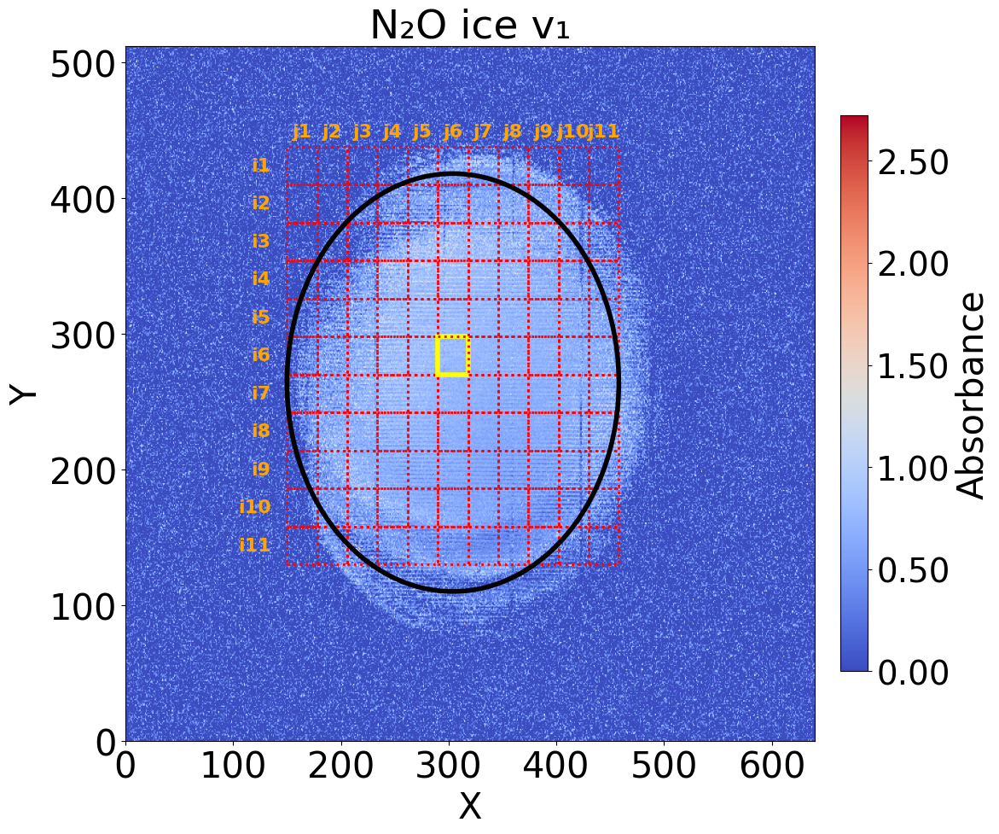


N₂O ice 2v₂ (8600nm):
  全体平均吸光度: 0.0550
  円内平均吸光度: 0.1804
  最大吸光度: 2.3168
  最小吸光度: -2.2497


C:\Users\daiki\AppData\Local\Temp\ipykernel_27300\2743148985.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.ax.set_yticklabels(tick_labels)


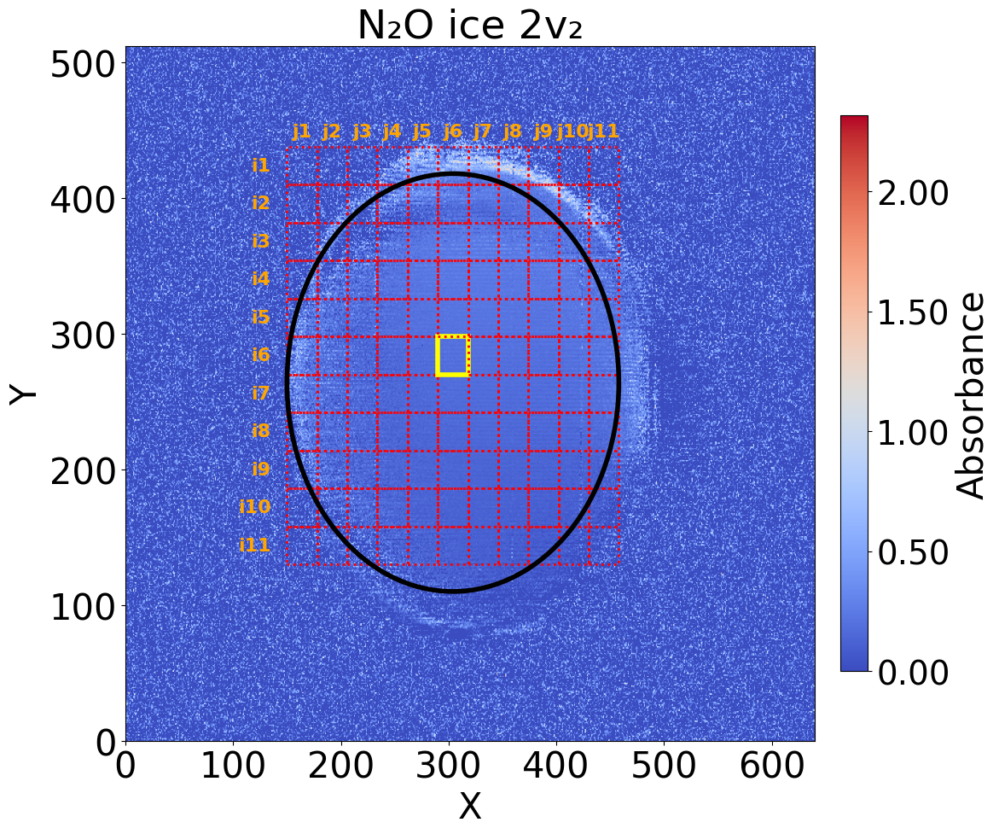


N₂O ice torsion (7270nm):
  全体平均吸光度: 0.0383
  円内平均吸光度: 0.1255
  最大吸光度: 2.3393
  最小吸光度: -2.2630


C:\Users\daiki\AppData\Local\Temp\ipykernel_27300\2743148985.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.ax.set_yticklabels(tick_labels)


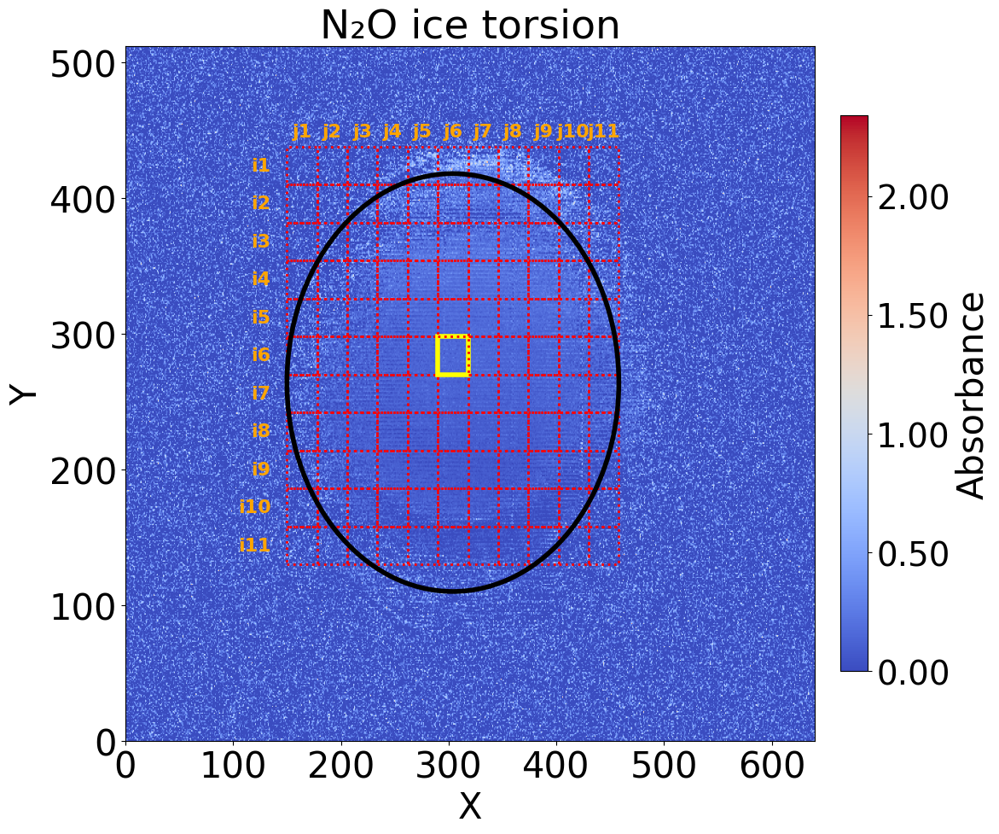

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import os
import matplotlib.patches as patches

# データパス設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
ref_path = os.path.join(base_path, 'ref/')
sample_path = os.path.join(base_path, '1014/')

# 対象波長（nm）とタイトルの辞書
target_wavelengths = {
    7750: "N₂O ice v₁",
    8600: "N₂O ice 2v₂",
    7270: "N₂O ice torsion"
}

def load_npy(file_path):
    if os.path.exists(file_path):
        return np.load(file_path)
    else:
        print(f"ファイルが見つかりません: {file_path}")
        return None

def calculate_absorbance(ref, sample):
    epsilon = 1e-10
    return np.log10((ref + epsilon) / (sample + epsilon))

def calculate_average_absorbance(absorbance_map):
    """吸光度マップの平均値を計算する関数"""
    # 全体の平均
    overall_avg = np.mean(absorbance_map)
    
    # 円内の平均（円の中心: (304, 264), 半径: 154）
    circle_radius = 154
    x_center, y_center = 304, 264
    ny, nx = absorbance_map.shape
    x, y = np.meshgrid(np.arange(nx), np.arange(ny))
    distance = np.sqrt((x - x_center)**2 + (y - y_center)**2)
    mask = distance <= circle_radius
    circle_avg = np.mean(absorbance_map[mask])
    
    return overall_avg, circle_avg

def plot_absorbance_map(absorbance_map, title):
    ny, nx = absorbance_map.shape
    plt.figure(figsize=(12, 10))

    max_val = np.max(absorbance_map)
    im = plt.imshow(absorbance_map, cmap='coolwarm', origin='lower',
                    extent=[0, nx, 0, ny], aspect='auto',
                    vmin=0, vmax=max_val)

    plt.xlabel('X', fontsize=30)
    plt.ylabel('Y', fontsize=30)
    plt.title(title, fontsize=34)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    add_grid_and_circle()

    cbar = plt.colorbar(im, shrink=0.8, pad=0.03)
    cbar.ax.tick_params(labelsize=28)
    cbar.set_label('Absorbance', fontsize=30)
    tick_labels = [f"{tick:.2f}" for tick in cbar.get_ticks()]
    cbar.ax.set_yticklabels(tick_labels)

    plt.tight_layout()
    plt.show()

def add_grid_and_circle():
    x_start, y_start = 150, 130
    x_bins, y_bins, bin_size = 11, 11, 28

    ax = plt.gca()

    for i in range(x_bins):
        for j in range(y_bins):
            x = x_start + bin_size * i
            y = y_start + bin_size * j

            # i6-j6の位置（i=5, j=5）だけ緑色で描画
            if i == 5 and j == 5:
                edge_color = 'yellow'
                line_style = 'solid'
                line_width = 4
            else:
                edge_color = 'red'
                line_style = 'dotted'
                line_width = 2

            # 四角形の描画
            rect = patches.Rectangle((x, y), bin_size, bin_size,
                                     lw=line_width, ec=edge_color, linestyle=line_style, fill=False)
            ax.add_patch(rect)

            # ラベルの描画（外側に配置）
            if j == y_bins - 1:  # 最上段に j ラベル
                ax.text(x + bin_size / 2, y + bin_size + 5, f"j{i+1}", ha='center', va='bottom',
                        fontsize=16, color='orange', fontweight='bold')
            if i == 0:  # 左端に i ラベル（逆順）
                ax.text(x_start - 15, y + bin_size / 2, f"i{y_bins - j}", ha='right', va='center',
                        fontsize=16, color='orange', fontweight='bold')

    # 緑の円の描画
    circle = patches.Circle((304, 264), radius=154, fc='g', fill=False, linewidth=4)
    ax.add_patch(circle)


def main():
    print("=== UV吸光度解析（3波長対応） ===")
    ref_file = os.path.join(ref_path, 'ref.npy')
    sample_file = os.path.join(sample_path, 'tg.npy')

    ref_data = load_npy(ref_file)
    sample_data = load_npy(sample_file)

    if ref_data is None or sample_data is None:
        return
    if ref_data.shape != sample_data.shape:
        print("参照データとサンプルデータの形状が一致しません。")
        return

    wavelength_array = np.arange(5000, 15000, 10)
    absorbance_cube = calculate_absorbance(ref_data, sample_data)

    print("\n=== 平均吸光度結果 ===")
    for target_nm, title in target_wavelengths.items():
        index = np.where(wavelength_array == target_nm)[0]
        if len(index) == 0:
            print(f"波長 {target_nm}nm が波長配列に見つかりません。")
            continue

        absorbance_map = absorbance_cube[index[0]]
        
        # 平均吸光度を計算
        overall_avg, circle_avg = calculate_average_absorbance(absorbance_map)
        
        # 結果を表示
        print(f"\n{title} ({target_nm}nm):")
        print(f"  全体平均吸光度: {overall_avg:.4f}")
        print(f"  円内平均吸光度: {circle_avg:.4f}")
        print(f"  最大吸光度: {np.max(absorbance_map):.4f}")
        print(f"  最小吸光度: {np.min(absorbance_map):.4f}")
        
        # プロット
        plot_absorbance_map(absorbance_map, title)

if __name__ == "__main__":
    main()

座標 (304, 264) の吸光度: 0.11366
A * log(10) = 0.26172
A * dv * log(10) = 4.71094
=== N₂O氷厚さマップ計算（7.75 µm波長） ===
厚さマップの統計情報:
  最小値: 0.000 µm
  最大値: 5.440 µm
  平均値: 0.558 µm
  標準偏差: 0.635 µm
N_map_(molecule/cm^2) の統計情報:
  最小値: -3.024e+18
  最大値: 4.083e+18
  平均値: 2.583e+17
  標準偏差: 6.738e+17

黒円の中の平均値:
  厚さ: 1.294 µm
  列柱密度: 9.631e+17


C:\Users\daiki\AppData\Local\Temp\ipykernel_27300\2757718665.py:111: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.ax.set_yticklabels(tick_labels)


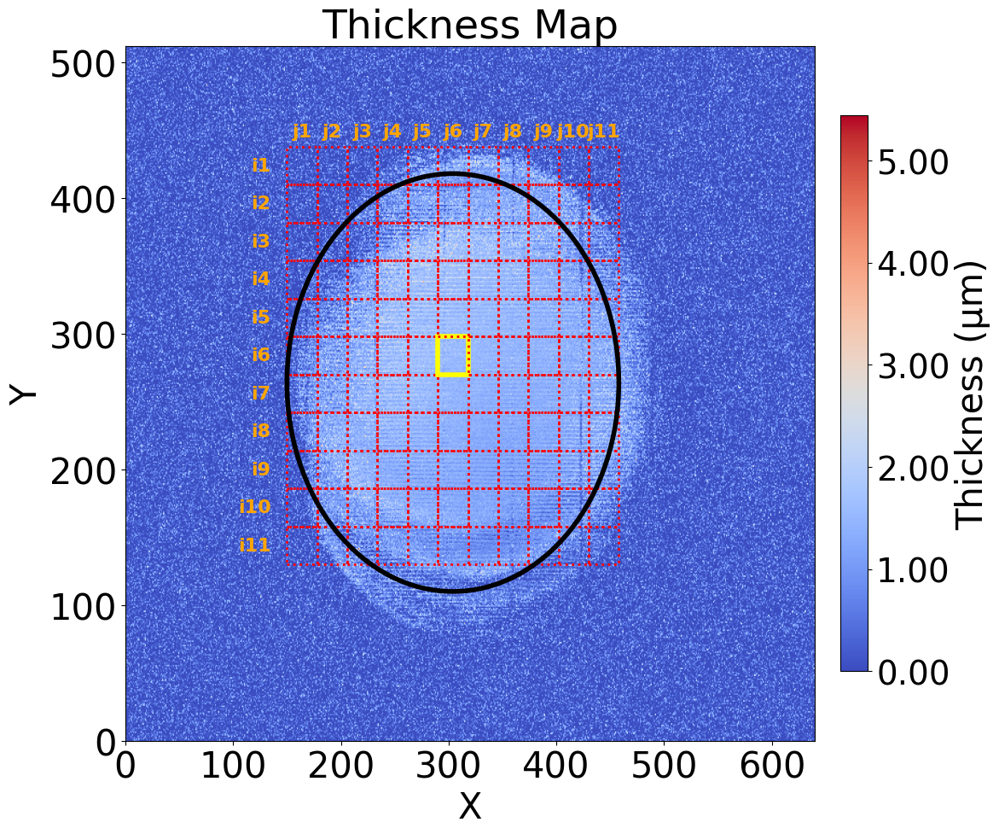

C:\Users\daiki\AppData\Local\Temp\ipykernel_27300\2757718665.py:143: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.ax.set_yticklabels(tick_labels)


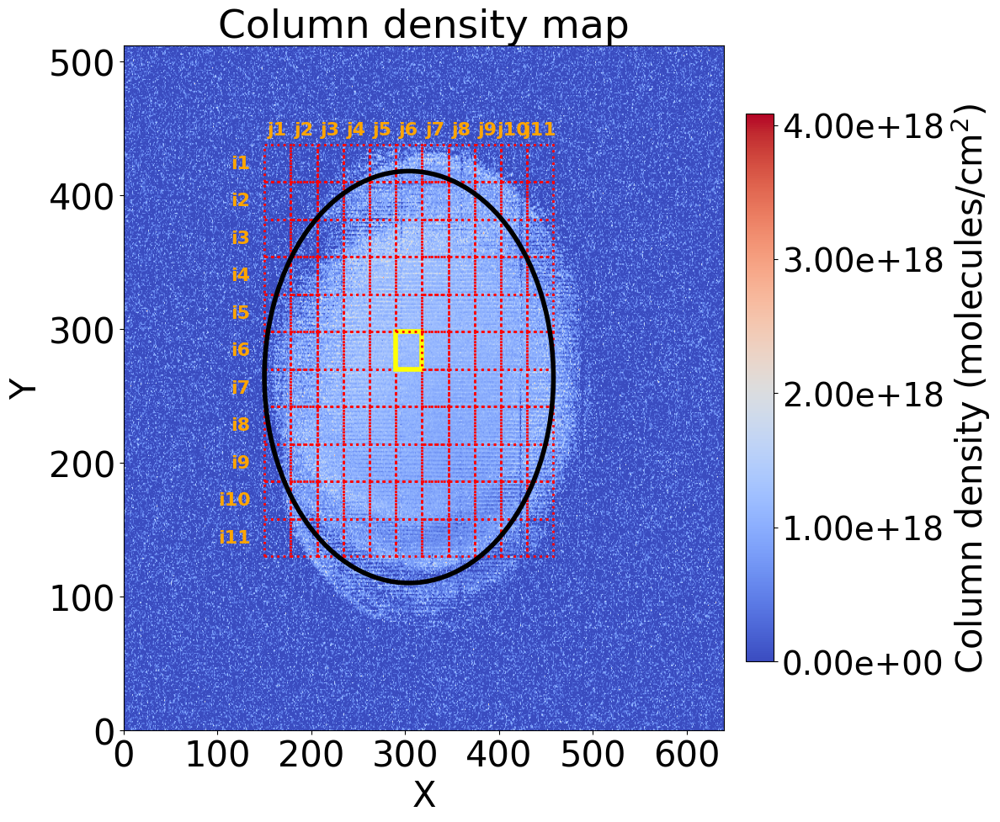

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import os
import math
import matplotlib.patches as patches

# データパス設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
ref_path = os.path.join(base_path, 'ref/')
sample_path = os.path.join(base_path, '1014/')

def load_npy(file_path):
    """npyファイルを読み込む関数"""
    if os.path.exists(file_path):
        return np.load(file_path)
    else:
        print(f"ファイルが見つかりません: {file_path}")
        return None

def calculate_absorbance(ref, sample):
    """吸光度を計算する関数"""
    epsilon = 1e-10
    return np.log10((ref + epsilon) / (sample + epsilon))

def calculate_thickness_map(absorbance_map):
    """7.96µm波長での吸光度から厚さマップを計算する関数"""
    # パラメータ設定
    AV_16 = 1.2e-17    # amorphous band strength (cm²/molecule)
    Z = 44             # N₂Oの分子量 (g/mol)
    NA = 6.02e23       # アボガドロ数 (molecules/mol)
    rho = 1.263        # N₂O氷の密度 (g/cm³)
    dv = 18           # 波数範囲(/cm)

    # 厚さマップ計算（µm単位）
    d_map_um = (absorbance_map * dv *  math.log(10) * Z) / (NA * AV_16 * rho ) * 1e4
    
    # 負の値を0に置換
    d_map_um[d_map_um < 0] = 0
    
    # N_map_(molecule/cm^2) 計算
    N_map_mol_cm2 = (absorbance_map * dv) / AV_16
    
    return d_map_um, N_map_mol_cm2

def add_grid_and_circle():
    """グリッドと円を追加する関数"""
    x_start, y_start = 150, 130
    x_bins, y_bins, bin_size = 11, 11, 28

    ax = plt.gca()

    for i in range(x_bins):
        for j in range(y_bins):
            x = x_start + bin_size * i
            y = y_start + bin_size * j

            # i6-j6の位置（i=5, j=5）だけ黄色で強調
            if i == 5 and j == 5:
                edge_color = 'yellow'
                line_style = 'solid'
                line_width = 4
            else:
                edge_color = 'red'
                line_style = 'dotted'
                line_width = 2

            # 四角形の描画
            rect = patches.Rectangle((x, y), bin_size, bin_size,
                                     lw=line_width, ec=edge_color, linestyle=line_style, fill=False)
            ax.add_patch(rect)

            # ラベルの描画（外側に配置）
            if j == y_bins - 1:  # 最上段に j ラベル
                ax.text(x + bin_size / 2, y + bin_size + 5, f"j{i+1}", ha='center', va='bottom',
                        fontsize=16, color='orange', fontweight='bold')
            if i == 0:  # 左端に i ラベル（逆順）
                ax.text(x_start - 15, y + bin_size / 2, f"i{y_bins - j}", ha='right', va='center',
                        fontsize=16, color='orange', fontweight='bold')

    # 緑の円の描画
    circle = patches.Circle((304, 264), radius=154, fc='g', fill=False, linewidth=4)
    ax.add_patch(circle)

def plot_thickness_map(thickness_map, title="Thickness Map"):
    """厚さマップをプロットする関数"""
    ny, nx = thickness_map.shape
    plt.figure(figsize=(12, 10))

    # カラーバーの範囲設定
    vmin = 0
    vmax = np.max(thickness_map)
    if vmin == vmax:
        vmax += 0.1  # 最大値と最小値が同じ場合の調整

    im = plt.imshow(thickness_map, cmap='coolwarm', origin='lower',
                    extent=[0, nx, 0, ny], aspect='auto',
                    vmin=vmin, vmax=vmax)

    plt.xlabel('X', fontsize=30)
    plt.ylabel('Y', fontsize=30)
    plt.title(title, fontsize=34)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    add_grid_and_circle()

    cbar = plt.colorbar(im, shrink=0.8, pad=0.03)
    cbar.ax.tick_params(labelsize=28)
    cbar.set_label('Thickness (µm)', fontsize=30)
    tick_labels = [f"{tick:.2f}" for tick in cbar.get_ticks()]
    cbar.ax.set_yticklabels(tick_labels)

    plt.tight_layout()
    plt.show()

def plot_n_map(n_map, title="Column density map"):
    """N_map_(molecule/cm^2)マップをプロットする関数"""
    ny, nx = n_map.shape
    plt.figure(figsize=(12, 10))

    # カラーバーの範囲設定
    vmin = 0
    vmax = np.max(n_map)
    if vmin == vmax:
        vmax += 0.1  # 最大値と最小値が同じ場合の調整

    im = plt.imshow(n_map, cmap='coolwarm', origin='lower',
                    extent=[0, nx, 0, ny], aspect='auto',
                vmin=vmin, vmax=vmax)

    plt.xlabel('X', fontsize=30)
    plt.ylabel('Y', fontsize=30)
    plt.title(title, fontsize=34)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    add_grid_and_circle()

    cbar = plt.colorbar(im, shrink=0.8, pad=0.03)
    cbar.ax.tick_params(labelsize=28)
    cbar.set_label('Column density (molecules/cm$^2$)', fontsize=30)
    tick_labels = [f"{tick:.2e}" for tick in cbar.get_ticks()]
    cbar.ax.set_yticklabels(tick_labels)

    plt.tight_layout()
    plt.show()

def main():
    """メイン関数"""
    print("=== N₂O氷厚さマップ計算（7.75 µm波長） ===")
    
    # ファイルパス設定
    ref_file = os.path.join(ref_path, 'ref.npy')
    sample_file = os.path.join(sample_path, 'tg.npy')

    # データ読み込み
    ref_data = load_npy(ref_file)
    sample_data = load_npy(sample_file)

    if ref_data is None or sample_data is None:
        return
    
    if ref_data.shape != sample_data.shape:
        print("参照データとサンプルデータの形状が一致しません。")
        return

    # 波長配列の設定
    wavelength_array = np.arange(5000, 15000, 10)
    
    # 吸光度キューブの計算
    absorbance_cube = calculate_absorbance(ref_data, sample_data)

    # 1290.3 cm⁻¹（7.75µm）のインデックスを取得
    target_wavenumber = 7750
    index = np.where(wavelength_array == target_wavenumber)[0]
    
    if len(index) == 0:
        print(f"波数 {target_wavenumber} cm⁻¹ が波長配列に見つかりません。")
        return

    # 7.75µmでの吸光度マップを取得
    A7750 = absorbance_cube[index[0]]
    
    # 厚さマップと N_map_(molecule/cm^2) を計算
    d_map_um, N_map_mol_cm2 = calculate_thickness_map(A7750)

    # 結果の表示
    print(f"厚さマップの統計情報:")
    print(f"  最小値: {np.min(d_map_um):.3f} µm")
    print(f"  最大値: {np.max(d_map_um):.3f} µm")
    print(f"  平均値: {np.mean(d_map_um):.3f} µm")
    print(f"  標準偏差: {np.std(d_map_um):.3f} µm")

    print(f"N_map_(molecule/cm^2) の統計情報:")
    print(f"  最小値: {np.min(N_map_mol_cm2):.3e}")
    print(f"  最大値: {np.max(N_map_mol_cm2):.3e}")
    print(f"  平均値: {np.mean(N_map_mol_cm2):.3e}")
    print(f"  標準偏差: {np.std(N_map_mol_cm2):.3e}")

    # 黒円の中の厚みとNの平均値を計算
    circle_radius = 154  # 円の半径（ピクセル単位）
    x_center, y_center = 304, 264  # 円の中心座標

    # マスクを作成
    ny, nx = d_map_um.shape
    x, y = np.meshgrid(np.arange(nx), np.arange(ny))
    distance = np.sqrt((x - x_center)**2 + (y - y_center)**2)
    mask = distance <= circle_radius

    avg_thickness_in_circle = np.mean(d_map_um[mask])
    avg_column_density_in_circle = np.mean(N_map_mol_cm2[mask])

    # 結果を表示
    print("\n黒円の中の平均値:")
    print(f"  厚さ: {avg_thickness_in_circle:.3f} µm")
    print(f"  列柱密度: {avg_column_density_in_circle:.3e}")

    # 厚さマップをプロット
    plot_thickness_map(d_map_um)

    # N_map_(molecule/cm^2) マップをプロット
    plot_n_map(N_map_mol_cm2)



# 仮の吸光度マップ（実際は A7750 を使用）
absorbance_map = np.random.rand(512, 512)  # 例：512×512のマップ

# 対象ピクセル座標
x, y = 304, 264

# パラメータ
dv = 18  # 波数範囲 (/cm)

# 吸光度取得
A = absorbance_map[y, x]

# 計算
log10_term = A * math.log(10)
full_term = A * dv * math.log(10)

# 結果表示
print(f"座標 ({x}, {y}) の吸光度: {A:.5f}")
print(f"A * log(10) = {log10_term:.5f}")
print(f"A * dv * log(10) = {full_term:.5f}")


if __name__ == "__main__":
    main()

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# データパス設定
ref_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/ref/'
time_data = {
    '0min': 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/1014/',
    '60min': 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/1114/',
    '70min': 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/1124/',
    '80min': 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/1134/',
    '90min': 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/1144/',
    '120min': 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/1214/',
    '510min': 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/1814/'
}

wavelength_data = {
    7750: 'N₂O v₁',
    8600: 'N₂O 2v₂',
    7270: 'N₂O torsion',
    5340: 'NO',
    5820: 'N₂O₄',
    6310: 'N₂O₃',
    9590: 'O₃',
    10300: 'O₃',
    10480: 'NO₃',
    12730: 'N₂O',
    12900: 'N₂O₃',
    13280: 'N₂O₄',
    13580: 'N₂O₅',
    14180: 'O₃'
}

def load_npy(file_path):
    if os.path.exists(file_path):
        return np.load(file_path)
    else:
        print(f"⚠ ファイルが見つかりません: {file_path}")
        return None

def calculate_absorbance(ref, sample):
    epsilon = 1e-10
    return np.log10((ref + epsilon) / (sample + epsilon))

def run_all_timepoints_analysis(target_wavelength):
    print(f"\n=== 波長 {target_wavelength}nm による解析開始 ===")
    wavelength_array = np.arange(5000, 15000, 10)
    index = np.where(wavelength_array == target_wavelength)[0]

    if len(index) == 0:
        print(f"指定波長 {target_wavelength}nm は配列に存在しません")
        return

    ref_file = os.path.join(ref_path, 'ref.npy')
    ref_data = load_npy(ref_file)
    if ref_data is None:
        return

    for time_label, sample_path in time_data.items():
        print(f"\n▶ {time_label} の解析中...")
        sample_file = os.path.join(sample_path, 'tg.npy')
        sample_data = load_npy(sample_file)

        if sample_data is None or sample_data.shape != ref_data.shape:
            print(f"⚠ データ不一致または欠損: {time_label}")
            continue

        absorbance_cube = calculate_absorbance(ref_data, sample_data)
        absorbance_map = absorbance_cube[index[0]]
        plot_absorbance_map(absorbance_map, time_label, target_wavelength)
        analyze_absorbance_characteristics(absorbance_map)

def plot_absorbance_map(absorbance_map, time_label, wavelength):
    ny, nx = absorbance_map.shape
    molecule = wavelength_data.get(wavelength, '不明な化学種')
    wavelength_um = wavelength / 1000

    plt.figure(figsize=(12, 10))
    max_val = np.max(absorbance_map)

    im = plt.imshow(absorbance_map, cmap='coolwarm', origin='lower',
                    extent=[0, nx, 0, ny], aspect='auto',
                    vmin=0, vmax=max_val)

    plt.title(f'After UV {time_label} {molecule} ({wavelength_um:.2f}µm)', fontsize=32)
    plt.xlabel('X', fontsize=38)
    plt.ylabel('Y', fontsize=38)
    plt.xticks(fontsize=28)
    plt.yticks(fontsize=28)

    add_grid_and_circle()

    cbar = plt.colorbar(im, shrink=0.8, pad=0.03)
    cbar.ax.tick_params(labelsize=30)
    cbar.set_label('Absorbance', fontsize=32)
    tick_labels = [f"{tick:.2f}" for tick in cbar.get_ticks()]
    cbar.ax.set_yticklabels(tick_labels)

    plt.tight_layout()
    plt.show()

def add_grid_and_circle():
    x_start, y_start = 150, 130
    x_bins, y_bins, bin_size = 11, 11, 28
    ax = plt.gca()

    for i in range(x_bins):
        for j in range(y_bins):
            x = x_start + bin_size * i
            y = y_start + bin_size * j

            if i == 5 and j == 5:
                edge_color = 'yellow'
                line_style = 'solid'
                line_width = 4
            else:
                edge_color = 'red'
                line_style = 'dotted'
                line_width = 2

            rect = patches.Rectangle((x, y), bin_size, bin_size,
                                     lw=line_width, ec=edge_color, linestyle=line_style, fill=False)
            ax.add_patch(rect)

            if j == y_bins - 1:
                ax.text(x + bin_size / 2, y + bin_size + 5, f"j{i+1}", ha='center', va='bottom',
                        fontsize=18, color='orange', fontweight='bold')
            if i == 0:
                ax.text(x_start - 15, y + bin_size / 2, f"i{y_bins - j}", ha='right', va='center',
                        fontsize=18, color='orange', fontweight='bold')

    circle = patches.Circle((304, 264), radius=154, fc='g', fill=False, linewidth=3)
    ax.add_patch(circle)

def analyze_absorbance_characteristics(absorbance_map):
    print("  ▶ 空間分布解析")
    center_y, center_x = np.array(absorbance_map.shape) // 2
    print(f"    中心座標: ({center_x}, {center_y})")
    print(f"    中心吸光度: {absorbance_map[center_y, center_x]:.4f}")

    max_pos = np.unravel_index(np.argmax(absorbance_map), absorbance_map.shape)
    min_pos = np.unravel_index(np.argmin(absorbance_map), absorbance_map.shape)
    print(f"    最大: {np.max(absorbance_map):.4f} @ {max_pos}")
    print(f"    最小: {np.min(absorbance_map):.4f} @ {min_pos}")

    indices = np.where(absorbance_map > 0.001)
    if indices[0].size > 0:
        spread_x = np.max(indices[1]) - np.min(indices[1])
        spread_y = np.max(indices[0]) - np.min(indices[0])
        print(f"    広がり: X={spread_x}px, Y={spread_y}px")

def main():
    for wavelength in wavelength_data.keys():
        run_all_timepoints_analysis(wavelength)

if __name__ == "__main__":
    main()
